<a href="https://colab.research.google.com/github/GilbertHong2/Healthy-Home/blob/main/Healthy_Home_Prediction_%26_Map_Visualization_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Healthy Home Prediction & Map Visalization

# 1.Set Environment & Libraries

In [1]:
# Set an environment for geopandas & other geo-related libraries

# Aclima/Purple Air

%%time

# Important library for many geopython libraries
!apt install gdal-bin python-gdal python3-gdal
# Install rtree - Geopandas requirment
!apt install python3-rtree
# Install Geopandas
!pip install git+git://github.com/geopandas/geopandas.git
# Install descartes - Geopandas requirment
!pip install descartes

# Geo-related libraries
!pip install geopandas
!pip install osmnx
!pip install contextily
!pip install folium
!pip install plotly_express
!pip install geofeather

# Others
!pip install matplotlib==3.1.3

Reading package lists... Done
Building dependency tree       
Reading state information... Done
Package python-gdal is not available, but is referred to by another package.
This may mean that the package is missing, has been obsoleted, or
is only available from another source
However the following packages replace it:
  gdal-bin

E: Package 'python-gdal' has no installation candidate
Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following additional packages will be installed:
  javascript-common libjs-jquery libjs-underscore libspatialindex-c6
  libspatialindex-dev libspatialindex6
Suggested packages:
  apache2 | lighttpd | httpd
The following NEW packages will be installed:
  javascript-common libjs-jquery libjs-underscore libspatialindex-c6
  libspatialindex-dev libspatialindex6 python3-rtree
0 upgraded, 7 newly installed, 0 to remove and 13 not upgraded.
Need to get 829 kB of archives.
After this operation, 3,054 kB of additiona

CPU times: user 2.31 s, sys: 289 ms, total: 2.6 s
Wall time: 4min 56s


In [2]:
# Data manipulation libraries
import os
import pandas as pd
import numpy as np

# Geo-related libraries
import geopandas as gpd
import osmnx as ox
import folium
from folium.plugins import HeatMap
import geopy
from geopy.geocoders import Nominatim
from geopy.extra.rate_limiter import RateLimiter
import contextily as ctx
import geofeather
from geopandas import GeoDataFrame
from shapely.geometry import Point
from shapely import wkt
from shapely.geometry import Point, MultiPoint
from shapely.ops import nearest_points
from shapely import wkt

# Visualization
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns

# Timer
from tqdm import tqdm, tqdm_notebook


# Regression
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import GradientBoostingRegressor
from xgboost import XGBRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.neighbors import KNeighborsRegressor


# Model support functions
from sklearn import model_selection
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from scipy.stats import uniform
from sklearn.preprocessing import StandardScaler
from pprint import pprint
from sklearn.inspection import permutation_importance
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# 2.Load Data

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
cd /content/drive/MyDrive/Colab Notebooks/

/content/drive/MyDrive/Colab Notebooks


In [5]:
# Read air pollutant & health info
df_1 = pd.read_csv("Home_n_Map.csv")
df_1.head(5)

,NO value,NO2 value,PM2p5 value,geometry,road_type,zone,tract_name,GEOID,state,county,pop_den,wind,temp,Longitude,Latitude,Respiratory_HI,Pt_CANCR
0,23.390071,17.539762,17.612700,POINT (-122.3225938 37.80678062),tertiary,industrial,"Census Tract 9819, Alameda County, California",6001981900,6,1,8.336845,4.133333,14.950001,-122.322594,37.806781,high,0.7 - 0.8
1,19.700000,19.956750,15.946719,POINT (-122.32231 37.80614989),secondary,industrial,"Census Tract 9819, Alameda County, California",6001981900,6,1,8.336845,4.133333,14.950001,-122.322310,37.806150,high,0.7 - 0.8
2,23.611111,23.967768,16.210698,POINT (-122.3223008 37.80642014),secondary,industrial,"Census Tract 9819, Alameda County, California",6001981900,6,1,8.336845,4.133333,14.950001,-122.322301,37.806420,high,0.7 - 0.8
3,15.714285,18.435184,15.561862,POINT (-122.3222988 37.80587979999999),secondary,industrial,"Census Tract 9819, Alameda County, California",6001981900,6,1,8.336845,4.133333,14.950001,-122.322299,37.805880,high,0.7 - 0.8
4,27.108695,25.797037,17.120884,POINT (-122.3222671 37.80668898),secondary,industrial,"Census Tract 9819, Alameda County, California",6001981900,6,1,8.336845,4.133333,14.950001,-122.322267,37.806689,high,0.7 - 0.8


In [6]:
# Check a null counts and data types
df_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18286 entries, 0 to 18285
Data columns (total 17 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   NO value        18286 non-null  float64
 1   NO2 value       18286 non-null  float64
 2   PM2p5 value     18286 non-null  float64
 3   geometry        18286 non-null  object 
 4   road_type       18286 non-null  object 
 5   zone            18238 non-null  object 
 6   tract_name      18286 non-null  object 
 7   GEOID           18286 non-null  int64  
 8   state           18286 non-null  int64  
 9   county          18286 non-null  int64  
 10  pop_den         18286 non-null  float64
 11  wind            18270 non-null  float64
 12  temp            18270 non-null  float64
 13  Longitude       18286 non-null  float64
 14  Latitude        18286 non-null  float64
 15  Respiratory_HI  18286 non-null  object 
 16  Pt_CANCR        18286 non-null  object 
dtypes: float64(8), int64(3), object

In [7]:
# Mapping the data points
# convert pandas df to geopandas df (based on latitude & longitude)

gpd_1_degree = gpd.GeoDataFrame(df_1, geometry=gpd.points_from_xy(df_1.Longitude, df_1.Latitude), crs={'init' :'epsg:4326'})
gpd_1_degree.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 18286 entries, 0 to 18285
Data columns (total 17 columns):
 #   Column          Non-Null Count  Dtype   
---  ------          --------------  -----   
 0   NO value        18286 non-null  float64 
 1   NO2 value       18286 non-null  float64 
 2   PM2p5 value     18286 non-null  float64 
 3   geometry        18286 non-null  geometry
 4   road_type       18286 non-null  object  
 5   zone            18238 non-null  object  
 6   tract_name      18286 non-null  object  
 7   GEOID           18286 non-null  int64   
 8   state           18286 non-null  int64   
 9   county          18286 non-null  int64   
 10  pop_den         18286 non-null  float64 
 11  wind            18270 non-null  float64 
 12  temp            18270 non-null  float64 
 13  Longitude       18286 non-null  float64 
 14  Latitude        18286 non-null  float64 
 15  Respiratory_HI  18286 non-null  object  
 16  Pt_CANCR        18286 non-null  object  
dtypes: f

/usr/local/lib/python3.10/dist-packages/pyproj/crs/crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


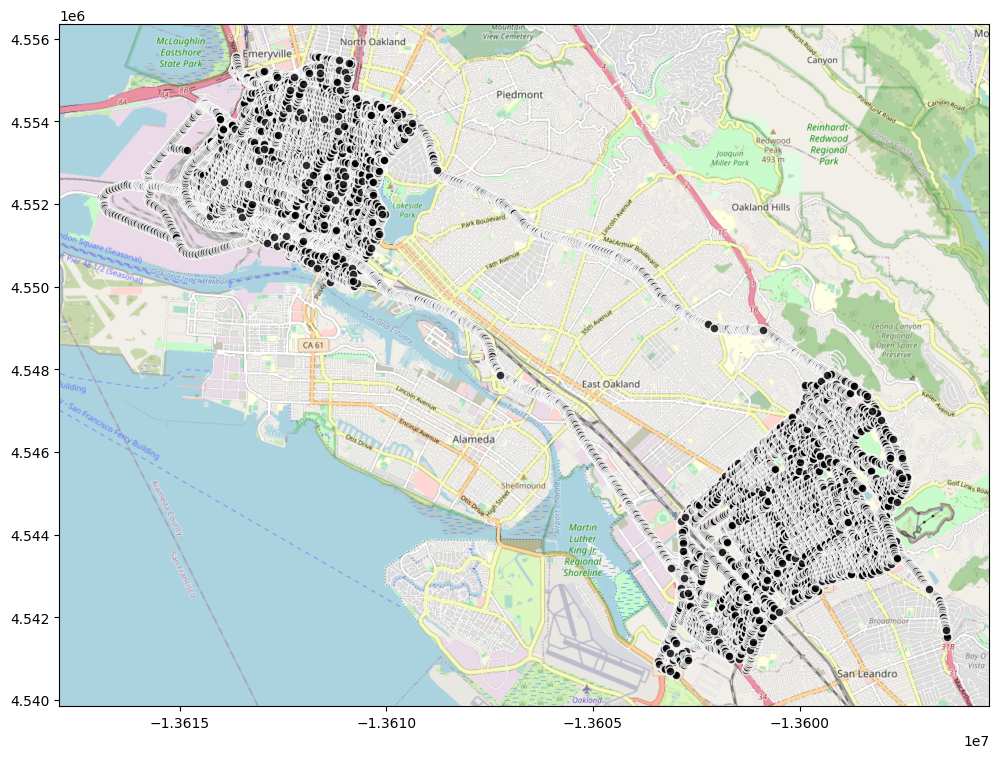

In [8]:
# Mapping the data points
# draw a figure

fig, ax = plt.subplots(figsize=(12, 10))
gpd_1_degree.to_crs(epsg=3857).plot(ax = ax,
                figsize=(12,12),
                markersize=40,
               color="black",
               edgecolor="white",
               alpha=0.8,
               marker="o"
            );
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)
# fig.savefig('output/file_name', dpi = 400, transparent = True)

# 3.Data Cleaning

In [9]:
# Check dataframe
df_1.head(2)

,NO value,NO2 value,PM2p5 value,geometry,road_type,zone,tract_name,GEOID,state,county,pop_den,wind,temp,Longitude,Latitude,Respiratory_HI,Pt_CANCR
0,23.390071,17.539762,17.612700,POINT (-122.3225938 37.80678062),tertiary,industrial,"Census Tract 9819, Alameda County, California",6001981900,6,1,8.336845,4.133333,14.950001,-122.322594,37.806781,high,0.7 - 0.8
1,19.700000,19.956750,15.946719,POINT (-122.32231 37.80614989),secondary,industrial,"Census Tract 9819, Alameda County, California",6001981900,6,1,8.336845,4.133333,14.950001,-122.322310,37.806150,high,0.7 - 0.8


## Rename

In [10]:
df_1 = df_1.rename(columns={'NO value': 'NO'})
df_1 = df_1.rename(columns={'NO2 value': 'NO2'})
df_1 = df_1.rename(columns={'PM2p5 value': 'PM2p5'})
# EDF_points = EDF_points.rename(index=str, columns={"NO Value": "NO", "NO2 Value": "NO2", "PM2p5 Value": "PM2p5"})

## Drop Irrelevant Feature

In [11]:
# count unique values for each feature - do this step bf missing data， preveting unnecessary filters
print(df_1.nunique())

NO                16015
NO2               18226
PM2p5             18281
geometry          18281
road_type             6
zone                  5
tract_name           73
GEOID                73
state                 1
county                1
pop_den              73
wind                 45
temp                 80
Longitude         18129
Latitude          18257
Respiratory_HI        3
Pt_CANCR              3
dtype: int64


In [12]:
# Drop columns (features)
df_1_drop = df_1.drop(['state', 'county', 'tract_name', 'GEOID'], axis=1)

df_1_drop.head(2)

,NO,NO2,PM2p5,geometry,road_type,zone,pop_den,wind,temp,Longitude,Latitude,Respiratory_HI,Pt_CANCR
0,23.390071,17.539762,17.612700,POINT (-122.3225938 37.80678062),tertiary,industrial,8.336845,4.133333,14.950001,-122.322594,37.806781,high,0.7 - 0.8
1,19.700000,19.956750,15.946719,POINT (-122.32231 37.80614989),secondary,industrial,8.336845,4.133333,14.950001,-122.322310,37.806150,high,0.7 - 0.8


## Missing Data

In [13]:
# Size of data
df_1_drop.shape # row x col

(18286, 13)

In [14]:
# Check missing data
print('Sum of N/A values', df_1_drop.isnull().sum())

Sum of N/A values NO                 0
NO2                0
PM2p5              0
geometry           0
road_type          0
zone              48
pop_den            0
wind              16
temp              16
Longitude          0
Latitude           0
Respiratory_HI     0
Pt_CANCR           0
dtype: int64


In [15]:
# handling the missing data - drop all N/A, (avg/front fill/back fill)
df_1_miss = df_1_drop.dropna(axis=0, subset=['zone', 'wind', 'temp'])
df_1_miss.tail(2)

,NO,NO2,PM2p5,geometry,road_type,zone,pop_den,wind,temp,Longitude,Latitude,Respiratory_HI,Pt_CANCR
18284,9.333333,9.039947,11.325624,POINT (-122.15509 37.77013811),motorway,residential,1475.818172,3.766667,14.600001,-122.155090,37.770138,low,< 0.4
18285,18.842105,16.122072,9.270166,POINT (-122.1390328 37.73246375),motorway,residential,486.040242,3.816667,15.041669,-122.139033,37.732464,low,< 0.4


In [16]:
# Reset index
df_1_miss = df_1_miss.reset_index()
# Check info
df_1_miss.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18222 entries, 0 to 18221
Data columns (total 14 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   index           18222 non-null  int64  
 1   NO              18222 non-null  float64
 2   NO2             18222 non-null  float64
 3   PM2p5           18222 non-null  float64
 4   geometry        18222 non-null  object 
 5   road_type       18222 non-null  object 
 6   zone            18222 non-null  object 
 7   pop_den         18222 non-null  float64
 8   wind            18222 non-null  float64
 9   temp            18222 non-null  float64
 10  Longitude       18222 non-null  float64
 11  Latitude        18222 non-null  float64
 12  Respiratory_HI  18222 non-null  object 
 13  Pt_CANCR        18222 non-null  object 
dtypes: float64(8), int64(1), object(5)
memory usage: 1.9+ MB


In [17]:
# Remove index
df_1_miss = df_1_miss.drop(['index'], axis=1)

## Duplicated values

In [18]:
# Size of data
df_1_miss.shape # row x col

(18222, 13)

In [19]:
# Extract duplicated row
df_1_miss[df_1_miss.duplicated()]

,NO,NO2,PM2p5,geometry,road_type,zone,pop_den,wind,temp,Longitude,Latitude,Respiratory_HI,Pt_CANCR
174,32.059862,24.190178,19.514652,POINT (-122.308528 37.81502824),secondary,industrial,220.026011,4.125000,15.000001,-122.308528,37.815028,high,0.7 - 0.8
504,16.426667,19.134740,18.727645,POINT (-122.3001287 37.80641093),secondary,mixed,3520.358174,4.083333,15.083335,-122.300129,37.806411,high,0.7 - 0.8
7161,92.638344,45.426999,28.987625,POINT (-122.233788 37.77509246),motorway,mixed,2351.277070,4.091667,15.166668,-122.233788,37.775092,high,0.7 - 0.8


In [20]:
# Remove duplicated row: ways to do it
# new = df.drop_duplicates(subset=['column1'], keep='first', inplace=False)
# new = df.drop_duplicates(subset=['column1'], keep='last', inplace=False)
# new = df.drop_duplicates(subset=['column1'], keep='false', inplace=False) remove all

# Remove duplicated values
df_1_dup = df_1_miss.drop_duplicates()
df_1_dup.tail(2)

,NO,NO2,PM2p5,geometry,road_type,zone,pop_den,wind,temp,Longitude,Latitude,Respiratory_HI,Pt_CANCR
18220,9.333333,9.039947,11.325624,POINT (-122.15509 37.77013811),motorway,residential,1475.818172,3.766667,14.600001,-122.155090,37.770138,low,< 0.4
18221,18.842105,16.122072,9.270166,POINT (-122.1390328 37.73246375),motorway,residential,486.040242,3.816667,15.041669,-122.139033,37.732464,low,< 0.4


In [21]:
# Reset index and check
df_1_dup.reset_index(inplace=True)
df_1_dup[df_1_dup.duplicated()]

,index,NO,NO2,PM2p5,geometry,road_type,zone,pop_den,wind,temp,Longitude,Latitude,Respiratory_HI,Pt_CANCR


## Outliers

In [22]:
df_1_out = df_1_dup.copy()
df_1_out.head(1)

,index,NO,NO2,PM2p5,geometry,road_type,zone,pop_den,wind,temp,Longitude,Latitude,Respiratory_HI,Pt_CANCR
0,0,23.390071,17.539762,17.6127,POINT (-122.3225938 37.80678062),tertiary,industrial,8.336845,4.133333,14.950001,-122.322594,37.806781,high,0.7 - 0.8


<Axes: ylabel='temp'>

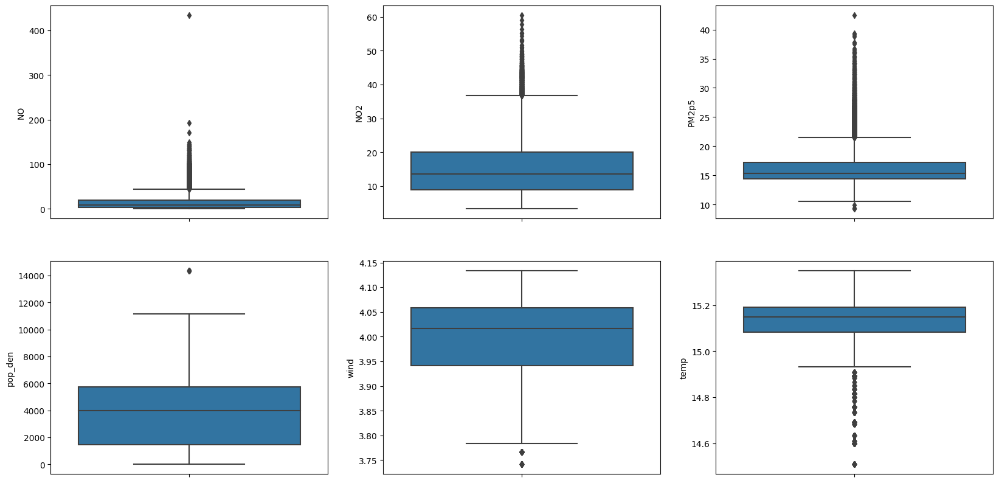

In [23]:
# Checking outliers

_,axss = plt.subplots(2,3, figsize=[20,10])  # create a 2x3 matrix = 6 figures
sns.boxplot(y ='NO', data=df_1_out, ax=axss[0, 0])
sns.boxplot(y ='NO2', data=df_1_out, ax=axss[0, 1])
sns.boxplot(y ='PM2p5', data=df_1_out, ax=axss[0, 2])
sns.boxplot(y ='pop_den', data=df_1_out, ax=axss[1][0])
sns.boxplot(y ='wind', data=df_1_out, ax=axss[1][1])
sns.boxplot(y ='temp', data=df_1_out, ax=axss[1][2])

In [24]:
# knowledge for NO: similar effect for high levels
df_1_out.loc[df_1_out['NO'] > 200, 'NO'] = 200

# 4.Feature Engineering: use geography data of Oakland City

In [25]:
Oakland_poly = ox.geocode_to_gdf('Oakland, California')
Oakland_poly

,geometry,bbox_north,bbox_south,bbox_east,bbox_west,place_id,osm_type,osm_id,lat,lon,display_name,class,type,importance
0,"POLYGON ((-122.35588 37.83573, -122.35009 37.8...",37.885426,37.633676,-122.11442,-122.355881,298690193,relation,2833530,37.804456,-122.271356,"Oakland, Alameda County, CAL Fire Northern Reg...",boundary,administrative,0.851796


<Axes: >

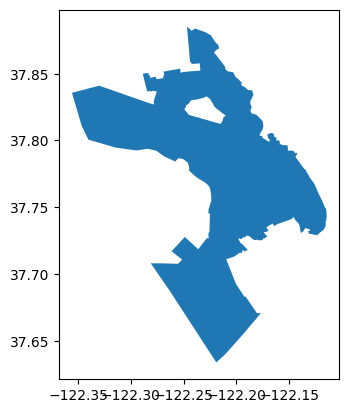

In [26]:
Oakland_poly.plot()

In [27]:
df_1_out['geometry']

0              POINT (-122.3225938 37.80678062)
1                POINT (-122.32231 37.80614989)
2              POINT (-122.3223008 37.80642014)
3        POINT (-122.3222988 37.80587979999999)
4              POINT (-122.3222671 37.80668898)
                          ...                  
18214          POINT (-122.2551005 37.81945168)
18215          POINT (-122.2360319 37.77631239)
18216           POINT (-122.178876 37.78403392)
18217            POINT (-122.15509 37.77013811)
18218          POINT (-122.1390328 37.73246375)
Name: geometry, Length: 18219, dtype: object

In [28]:
# Convert to geo df
df_1_out['geometry'] = df_1_out['geometry'].apply(lambda x: Point(map(float, x.lstrip('POINT (').rstrip(')').split())))
gpd_1_degree = gpd.GeoDataFrame(df_1_out, geometry = df_1_out['geometry'], crs={'init' :'epsg:4326'})
Oakland_poly.crs, gpd_1_degree.crs

/usr/local/lib/python3.10/dist-packages/pyproj/crs/crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


(<Geographic 2D CRS: EPSG:4326>
 Name: WGS 84
 Axis Info [ellipsoidal]:
 - Lat[north]: Geodetic latitude (degree)
 - Lon[east]: Geodetic longitude (degree)
 Area of Use:
 - name: World.
 - bounds: (-180.0, -90.0, 180.0, 90.0)
 Datum: World Geodetic System 1984 ensemble
 - Ellipsoid: WGS 84
 - Prime Meridian: Greenwich,
 <Geographic 2D CRS: +init=epsg:4326 +type=crs>
 Name: WGS 84
 Axis Info [ellipsoidal]:
 - lon[east]: Longitude (degree)
 - lat[north]: Latitude (degree)
 Area of Use:
 - name: World.
 - bounds: (-180.0, -90.0, 180.0, 90.0)
 Datum: World Geodetic System 1984 ensemble
 - Ellipsoid: WGS 84
 - Prime Meridian: Greenwich)

In [29]:
# join the dataset health with the Oakland polygon grid
gpd_1_city = gpd.sjoin(gpd_1_degree, Oakland_poly, how="inner", op="intersects")
gpd_1_city.head(2)

/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py:3473: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if (await self.run_code(code, result,  async_=asy)):
<ipython-input-29-8b5cffce209a>:2: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: +init=epsg:4326 +type=crs
Right CRS: EPSG:4326

  gpd_1_city = gpd.sjoin(gpd_1_degree, Oakland_poly, how="inner", op="intersects")


,index,NO,NO2,PM2p5,geometry,road_type,zone,pop_den,wind,temp,...,bbox_west,place_id,osm_type,osm_id,lat,lon,display_name,class,type,importance
0,0,23.390071,17.539762,17.612700,POINT (-122.32259 37.80678),tertiary,industrial,8.336845,4.133333,14.950001,...,-122.355881,298690193,relation,2833530,37.804456,-122.271356,"Oakland, Alameda County, CAL Fire Northern Reg...",boundary,administrative,0.851796
1,1,19.700000,19.956750,15.946719,POINT (-122.32231 37.80615),secondary,industrial,8.336845,4.133333,14.950001,...,-122.355881,298690193,relation,2833530,37.804456,-122.271356,"Oakland, Alameda County, CAL Fire Northern Reg...",boundary,administrative,0.851796


In [30]:
# drop unnecessary cols
print(gpd_1_city.nunique())

index             18217
NO                15961
NO2               18161
PM2p5             18215
geometry          18215
road_type             6
zone                  5
pop_den              70
wind                 45
temp                 80
Longitude         18065
Latitude          18192
Respiratory_HI        3
Pt_CANCR              3
index_right           1
bbox_north            1
bbox_south            1
bbox_east             1
bbox_west             1
place_id              1
osm_type              1
osm_id                1
lat                   1
lon                   1
display_name          1
class                 1
type                  1
importance            1
dtype: int64


In [31]:
gpd_1_city = gpd_1_city.drop(['index_right', 'bbox_east', 'bbox_north', 'bbox_south', 'bbox_west'], axis=1)

## Identify City structure

### Streets

In [32]:
# street data (roads and intersections) for entire city
oak_streets = ox.graph_from_place('Oakland, California', network_type = 'drive')
nodes, edges = ox.graph_to_gdfs(oak_streets)

In [33]:
nodes.head(1)

,y,x,ref,highway,street_count,geometry
osmid,,,,,,
30362888,37.825844,-122.303049,8A,motorway_junction,3,POINT (-122.30305 37.82584)


In [34]:
edges.head(1)

,,,osmid,oneway,lanes,ref,highway,maxspeed,reversed,length,geometry,bridge,name,tunnel,access,junction
u,v,key,,,,,,,,,,,,,,
30362888,1943438853,0,710721717,True,7,I 80,motorway,50 mph,False,135.576,"LINESTRING (-122.30305 37.82584, -122.30455 37...",NaN,NaN,NaN,NaN,NaN


<Axes: >

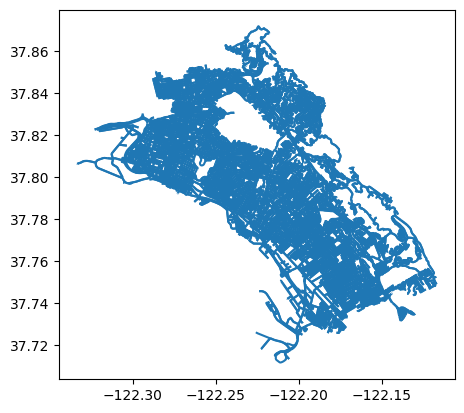

In [35]:
edges.plot()

In [36]:
# Identify roads
oakland_rds = edges.copy()
print(oakland_rds['highway'].value_counts())
print (oakland_rds.shape)

residential                        15014
secondary                           3106
tertiary                            2424
primary                              727
motorway_link                        322
motorway                             209
unclassified                         196
secondary_link                        98
trunk                                 56
tertiary_link                         45
trunk_link                            37
living_street                         24
primary_link                          15
busway                                12
[unclassified, residential]           10
[living_street, residential]           2
[secondary, tertiary]                  2
[motorway, motorway_link]              2
[motorway_link, secondary_link]        2
[motorway, trunk]                      1
Name: highway, dtype: int64
(22304, 14)


In [37]:
# Clean up road names
# remove '_link' in xxx_link & add it to xxx
# (e.g., motorway_link is added on motorway )
oakland_rds['highway'] = oakland_rds['highway'].str.replace('_link', '')

# 'trunk'  -->  'secondary'
oakland_rds['highway'] = np.where(oakland_rds['highway'] == 'trunk', 'secondary', oakland_rds['highway'])

# 'living_street' --> 'residential'
oakland_rds['highway'] = np.where(oakland_rds['highway'] == 'living_street', 'residential', oakland_rds['highway'])

print(oakland_rds['highway'].value_counts())

residential     15038
secondary        3297
tertiary         2469
primary           742
motorway          531
unclassified      196
busway             12
Name: highway, dtype: int64


In [38]:
# Map them out
# separate as subsets of roadtypes
oakland_highways = oakland_rds[oakland_rds.highway == 'motorway']
oakland_primary = oakland_rds[oakland_rds.highway == 'primary']
oakland_secondary = oakland_rds[oakland_rds.highway == 'secondary']
oakland_tertiary = oakland_rds[oakland_rds.highway == 'tertiary']
oakland_resid = oakland_rds[oakland_rds.highway == 'residential']

oakland_highways.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

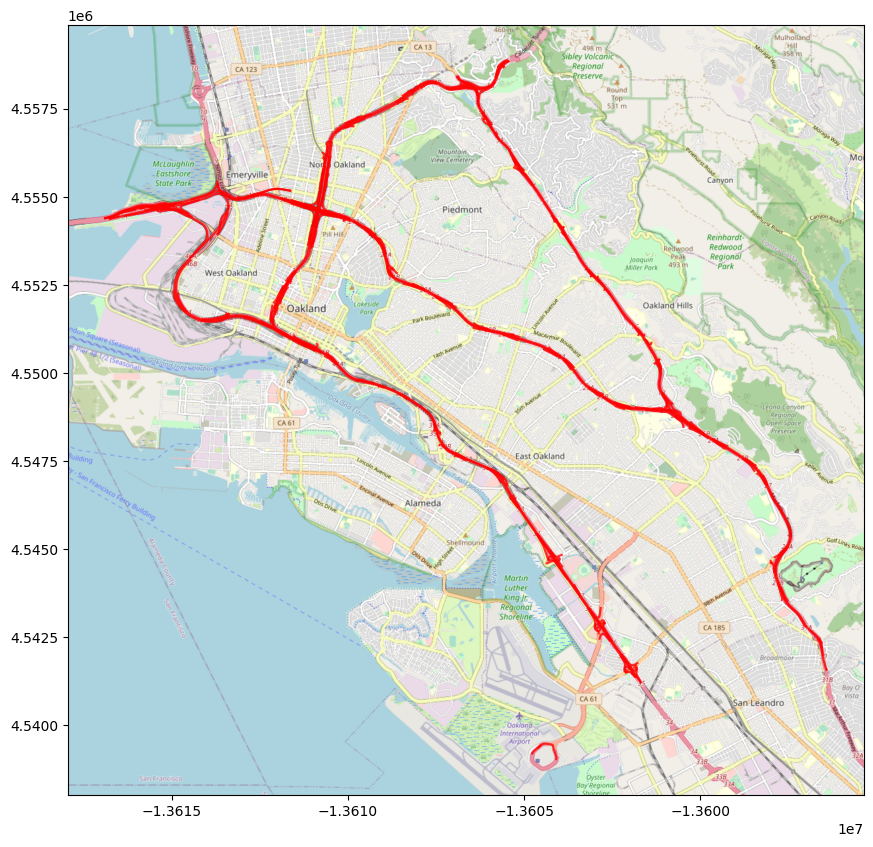

In [39]:
# Highway
fig, ax = plt.subplots(figsize=(12, 10))
oakland_highways.to_crs(epsg=3857).plot(ax = ax,
                figsize=(12,12),
                markersize=40,
               color="red",
               edgecolor="white",
               alpha=0.8,
               marker="o"
            );
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)

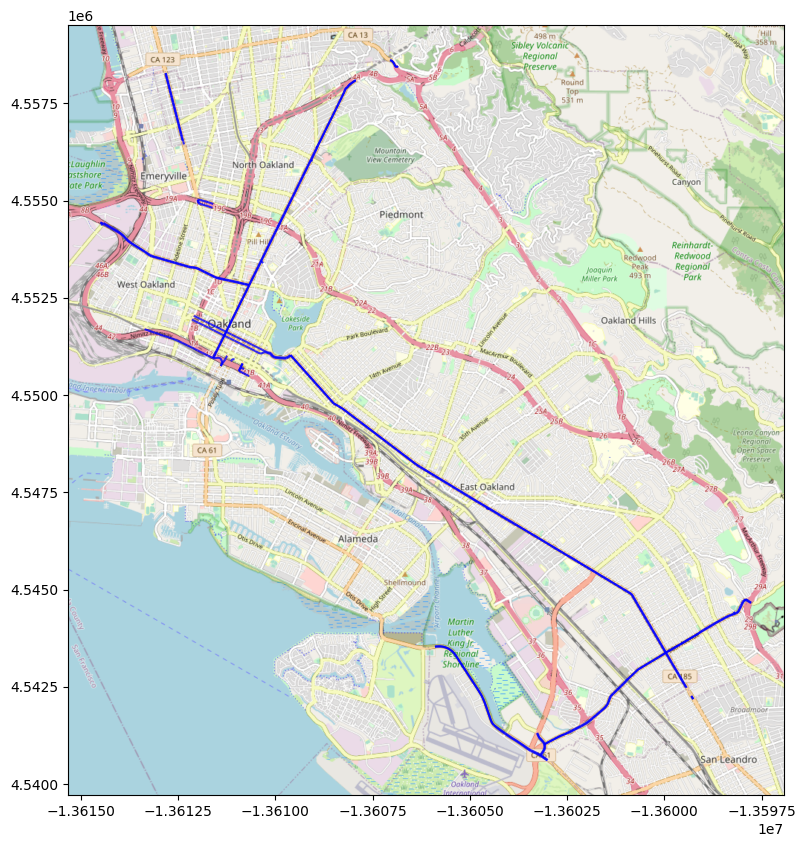

In [40]:
# Primary road
fig, ax = plt.subplots(figsize=(12, 10))
oakland_primary.to_crs(epsg=3857).plot(ax = ax,
                figsize=(12,12),
                markersize=40,
               color="blue",
               edgecolor="white",
               alpha=0.8,
               marker="o"
            );
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)

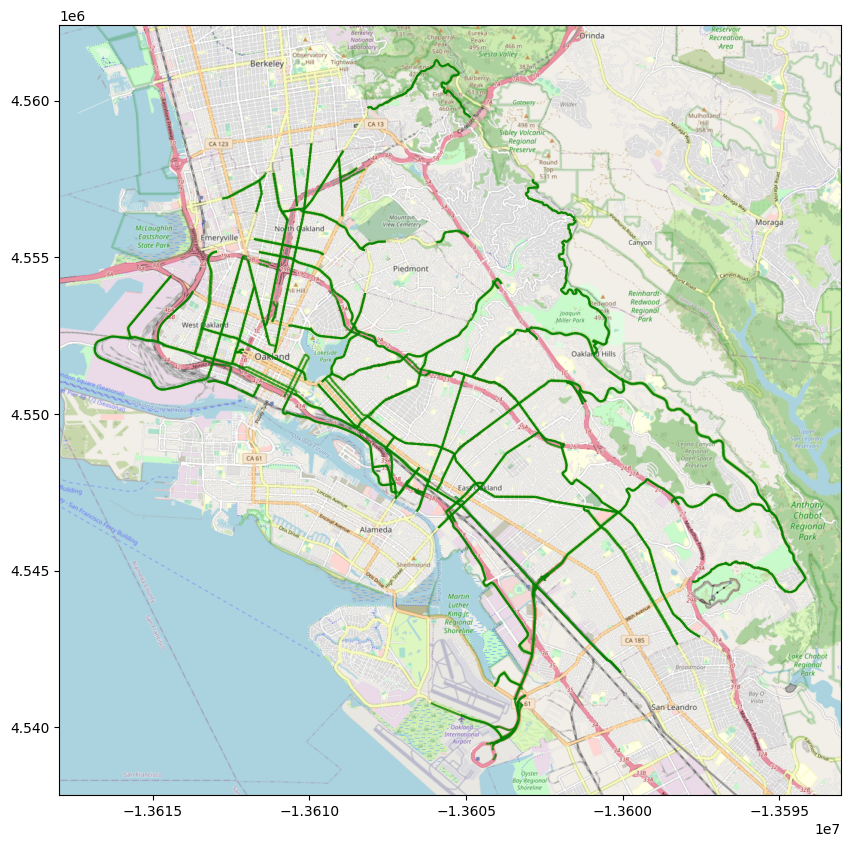

In [41]:
# Secondary road
fig, ax = plt.subplots(figsize=(12, 10))
oakland_secondary.to_crs(epsg=3857).plot(ax = ax,
                figsize=(12,12),
                markersize=40,
               color="green",
               edgecolor="white",
               alpha=0.8,
               marker="o"
            );
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)

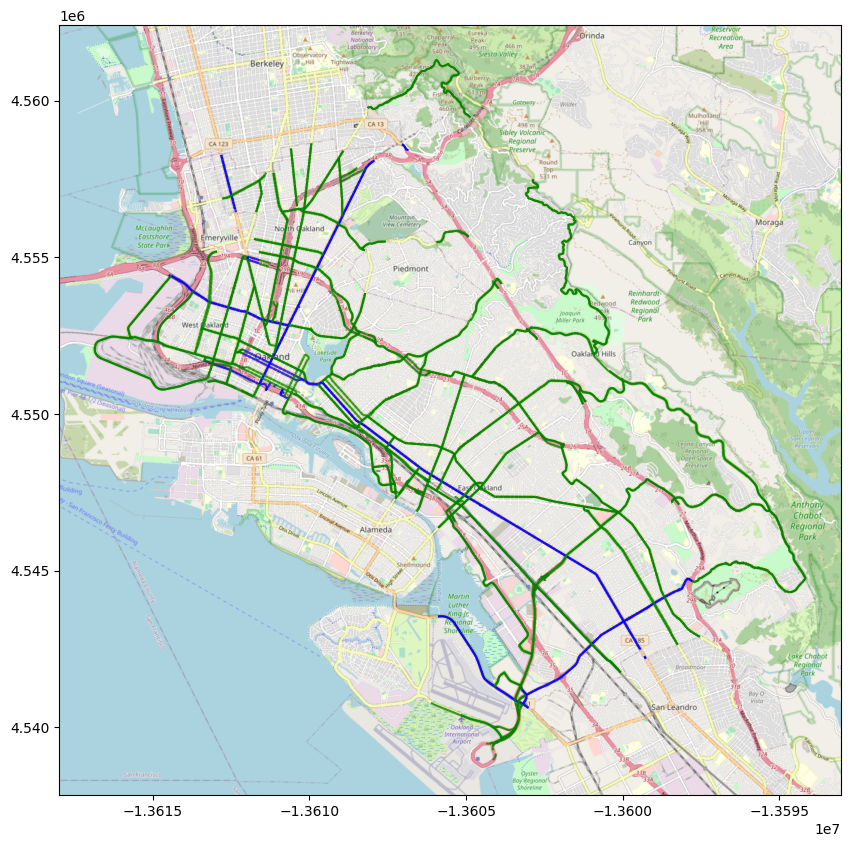

In [42]:
# Primary & Secondary
fig, ax = plt.subplots(figsize=(12, 10))
oakland_primary.to_crs(epsg=3857).plot(ax = ax,
                figsize=(12,12),
                markersize=40,
               color="blue",
               edgecolor="white",
               alpha=0.8,
               marker="o"
            );
oakland_secondary.to_crs(epsg=3857).plot(ax = ax,
                figsize=(12,12),
                markersize=40,
               color="green",
               edgecolor="white",
               alpha=0.8,
               marker="o"
            );

ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)

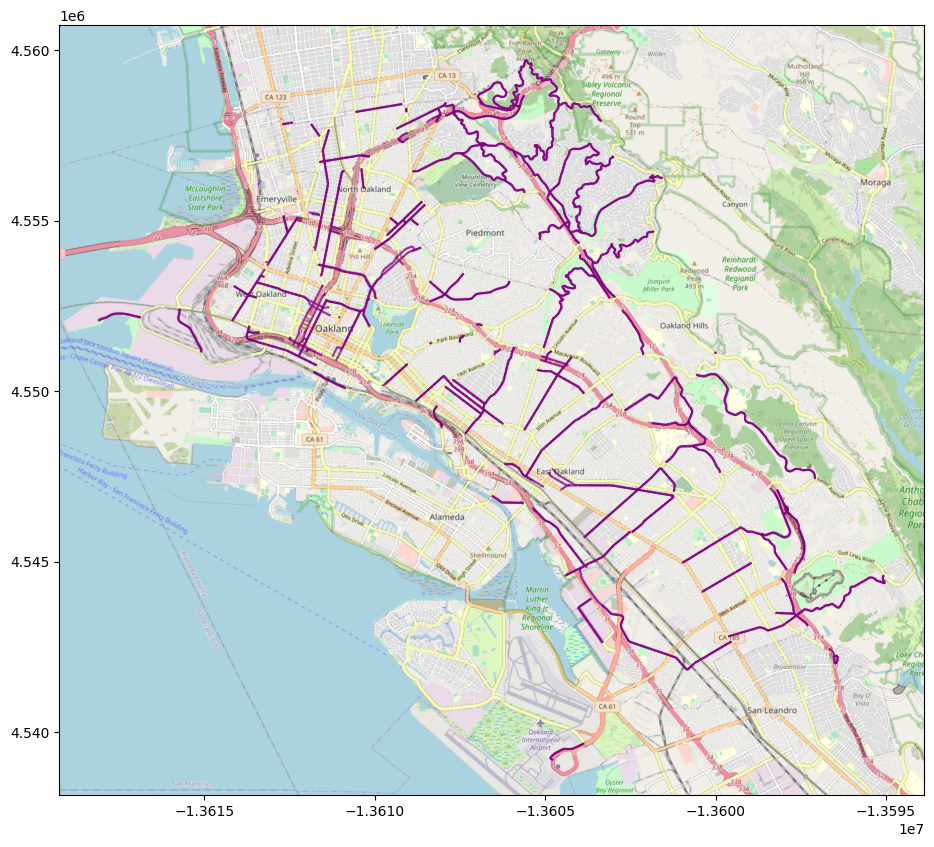

In [43]:
# Tertiary road
fig, ax = plt.subplots(figsize=(12, 10))
oakland_tertiary.to_crs(epsg=3857).plot(ax = ax,
                figsize=(12,12),
                markersize=40,
               color="purple",
               edgecolor="white",
               alpha=0.8,
               marker="o"
            );
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)

In [44]:
gpd_1_city.crs

<Geographic 2D CRS: +init=epsg:4326 +type=crs>
Name: WGS 84
Axis Info [ellipsoidal]:
- lon[east]: Longitude (degree)
- lat[north]: Latitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [45]:
# Now calculate the distance from the road
# Convert geometry from degree to meter
gpd_1_city_utm = gpd_1_city.to_crs({'init': 'epsg:32610'}).copy()
highway_utm = oakland_highways.to_crs({'init': 'epsg:32610'}).copy()
primary_utm = oakland_primary.to_crs({'init': 'epsg:32610'}).copy()
secondary_utm = oakland_secondary.to_crs({'init': 'epsg:32610'}).copy()
tertiary_utm = oakland_tertiary.to_crs({'init': 'epsg:32610'}).copy()

# UDF
def distance_to_roadway(gps, roadway):
    '''Calculate distance from GPS point to nearest road line polygon'''
    dists = []
    for i in roadway.geometry:
        dists.append(i.distance(gps))
    return(np.min(dists))

# Calculate distance to nearest major roadway
gpd_1_city['closest_highway'] = gpd_1_city_utm['geometry'].apply(distance_to_roadway, roadway = highway_utm)
gpd_1_city['closest_primary'] = gpd_1_city_utm['geometry'].apply(distance_to_roadway, roadway = primary_utm)
gpd_1_city['closest_secondary'] = gpd_1_city_utm['geometry'].apply(distance_to_roadway, roadway = secondary_utm)
gpd_1_city['closest_tertiary'] = gpd_1_city_utm['geometry'].apply(distance_to_roadway, roadway = tertiary_utm)

/usr/local/lib/python3.10/dist-packages/pyproj/crs/crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


In [46]:
gpd_1_city.head(2)

,index,NO,NO2,PM2p5,geometry,road_type,zone,pop_den,wind,temp,...,lat,lon,display_name,class,type,importance,closest_highway,closest_primary,closest_secondary,closest_tertiary
0,0,23.390071,17.539762,17.612700,POINT (-122.32259 37.80678),tertiary,industrial,8.336845,4.133333,14.950001,...,37.804456,-122.271356,"Oakland, Alameda County, CAL Fire Northern Reg...",boundary,administrative,0.851796,1529.354679,2576.575272,3.000134e+01,0.003395
1,1,19.700000,19.956750,15.946719,POINT (-122.32231 37.80615),secondary,industrial,8.336845,4.133333,14.950001,...,37.804456,-122.271356,"Oakland, Alameda County, CAL Fire Northern Reg...",boundary,administrative,0.851796,1510.616902,2605.774822,5.010205e-08,63.387249


### traffic signal & stop sign

In [47]:
# Identify traffic signals & stop signs
nodes['highway'].value_counts()

traffic_signals      783
stop                 364
turning_circle       322
motorway_junction    132
crossing              12
mini_roundabout        4
trailhead              3
turning_loop           1
Name: highway, dtype: int64

In [48]:
nodes.head(2)

,y,x,ref,highway,street_count,geometry
osmid,,,,,,
30362888,37.825844,-122.303049,8A,motorway_junction,3,POINT (-122.30305 37.82584)
30363957,37.825477,-122.307034,NaN,NaN,3,POINT (-122.30703 37.82548)


In [49]:
nodes.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

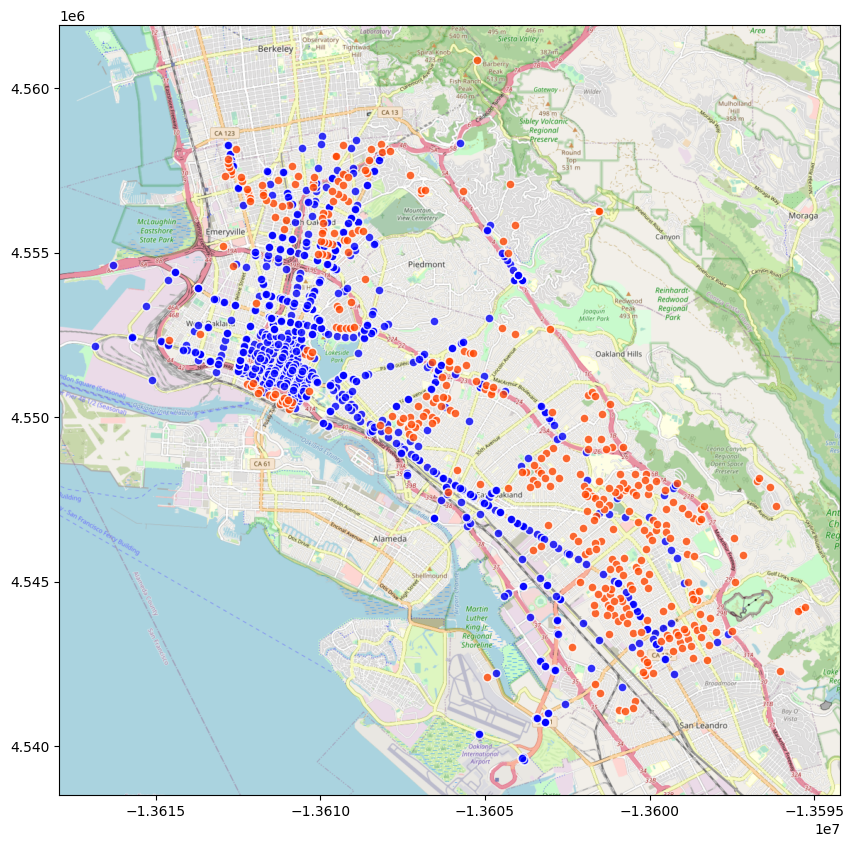

In [50]:
# Map them out
trafic_signals = nodes[nodes['highway'] == 'traffic_signals']
stop_cross = nodes[nodes['highway'] == 'stop']

# Traffic signal: blue
# Stop sign: red
fig, ax = plt.subplots(figsize=(12, 10))
trafic_signals.to_crs(epsg=3857).plot(ax = ax,
                figsize=(12,12),
                markersize=40,
               color="blue",
               edgecolor="white",
               alpha=0.8,
               marker="o"
            );
stop_cross.to_crs(epsg=3857).plot(ax = ax,
                figsize=(12,12),
                markersize=40,
               color="orangered",
               edgecolor="white",
               alpha=0.8,
               marker="o"
            );
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)

In [51]:
# Convert geometry from degree to meter
traffic_sig_utm = trafic_signals.to_crs({'init': 'epsg:32610'}).copy()
stop_sign_utm = stop_cross.to_crs({'init': 'epsg:32610'}).copy()

# set UDF
def nearest_intersection(gps, intersections):
    ''' Calculates distance from GPS point to nearest intersection'''
    closest_point = nearest_points(gps, MultiPoint(intersections.values))[1]
    return(gps.distance(closest_point))

/usr/local/lib/python3.10/dist-packages/pyproj/crs/crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


In [52]:
# tqdm.pandas() # show progress bar
# gpd_1_city['trafic_signal_dist'] = gpd_1_city_utm['geometry'].progress_apply(nearest_intersection, intersections = traffic_sig_utm['geometry'])
gpd_1_city['trafic_signal_dist'] = gpd_1_city_utm['geometry'].apply(nearest_intersection, intersections = traffic_sig_utm['geometry'])

In [53]:
# Calculate distance to nearest traffic signal
gpd_1_city['stop_sign_dist'] = gpd_1_city_utm['geometry'].apply(nearest_intersection, intersections = stop_sign_utm['geometry'])

## Category Encoding

In [54]:
gpd_1_city.head(2)

,index,NO,NO2,PM2p5,geometry,road_type,zone,pop_den,wind,temp,...,display_name,class,type,importance,closest_highway,closest_primary,closest_secondary,closest_tertiary,trafic_signal_dist,stop_sign_dist
0,0,23.390071,17.539762,17.612700,POINT (-122.32259 37.80678),tertiary,industrial,8.336845,4.133333,14.950001,...,"Oakland, Alameda County, CAL Fire Northern Reg...",boundary,administrative,0.851796,1529.354679,2576.575272,3.000134e+01,0.003395,30.001344,1818.142667
1,1,19.700000,19.956750,15.946719,POINT (-122.32231 37.80615),secondary,industrial,8.336845,4.133333,14.950001,...,"Oakland, Alameda County, CAL Fire Northern Reg...",boundary,administrative,0.851796,1510.616902,2605.774822,5.010205e-08,63.387249,63.387249,1800.106387


In [55]:
zone = gpd_1_city['zone']
road_type = gpd_1_city['road_type']

In [56]:
gpd_1_city = pd.get_dummies(gpd_1_city, columns=['road_type'], drop_first=False)
gpd_1_city = pd.get_dummies(gpd_1_city, columns=['zone'], drop_first=False)

gpd_1_city.head(2)

,index,NO,NO2,PM2p5,geometry,pop_den,wind,temp,Longitude,Latitude,...,road_type_primary,road_type_residential,road_type_secondary,road_type_tertiary,road_type_unclassified,zone_commercial,zone_industrial,zone_mixed,zone_open_space,zone_residential
0,0,23.390071,17.539762,17.612700,POINT (-122.32259 37.80678),8.336845,4.133333,14.950001,-122.322594,37.806781,...,0,0,0,1,0,0,1,0,0,0
1,1,19.700000,19.956750,15.946719,POINT (-122.32231 37.80615),8.336845,4.133333,14.950001,-122.322310,37.806150,...,0,0,1,0,0,0,1,0,0,0


In [57]:
gpd_1_city = pd.concat([gpd_1_city, zone], axis = 1)
gpd_1_city = pd.concat([gpd_1_city, road_type], axis = 1)

gpd_1_city.head(2)

,index,NO,NO2,PM2p5,geometry,pop_den,wind,temp,Longitude,Latitude,...,road_type_secondary,road_type_tertiary,road_type_unclassified,zone_commercial,zone_industrial,zone_mixed,zone_open_space,zone_residential,zone,road_type
0,0,23.390071,17.539762,17.612700,POINT (-122.32259 37.80678),8.336845,4.133333,14.950001,-122.322594,37.806781,...,0,1,0,0,1,0,0,0,industrial,tertiary
1,1,19.700000,19.956750,15.946719,POINT (-122.32231 37.80615),8.336845,4.133333,14.950001,-122.322310,37.806150,...,1,0,0,0,1,0,0,0,industrial,secondary


## Data Preparation

In [58]:
gpd_1_city.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 18217 entries, 0 to 18218
Data columns (total 40 columns):
 #   Column                  Non-Null Count  Dtype   
---  ------                  --------------  -----   
 0   index                   18217 non-null  int64   
 1   NO                      18217 non-null  float64 
 2   NO2                     18217 non-null  float64 
 3   PM2p5                   18217 non-null  float64 
 4   geometry                18217 non-null  geometry
 5   pop_den                 18217 non-null  float64 
 6   wind                    18217 non-null  float64 
 7   temp                    18217 non-null  float64 
 8   Longitude               18217 non-null  float64 
 9   Latitude                18217 non-null  float64 
 10  Respiratory_HI          18217 non-null  object  
 11  Pt_CANCR                18217 non-null  object  
 12  place_id                18217 non-null  int64   
 13  osm_type                18217 non-null  object  
 14  osm_id        

In [59]:
# Drop features
gpd_1_city = gpd_1_city.drop(['index', 'Pt_CANCR'], axis=1)

### Conversion

In [60]:
# if df['Respiratory_HI'] contains 'high', replace "high" to "3" and save into df['Respiratory_HI'], similar for 'moderate' and 'low'
gpd_1_city['Respiratory_HI'] = np.where(gpd_1_city['Respiratory_HI'].str.contains('high'), '3', gpd_1_city['Respiratory_HI'])
gpd_1_city['Respiratory_HI'] = np.where(gpd_1_city['Respiratory_HI'].str.contains('moderate'), '2', gpd_1_city['Respiratory_HI'])
gpd_1_city['Respiratory_HI'] = np.where(gpd_1_city['Respiratory_HI'].str.contains('low'), '1', gpd_1_city['Respiratory_HI'])

gpd_1_city["Respiratory_HI"] = gpd_1_city.Respiratory_HI.astype(float)
gpd_1_city.head(3)
# gpd_1_city.Respiratory_HI.value_counts()

,NO,NO2,PM2p5,geometry,pop_den,wind,temp,Longitude,Latitude,Respiratory_HI,...,road_type_secondary,road_type_tertiary,road_type_unclassified,zone_commercial,zone_industrial,zone_mixed,zone_open_space,zone_residential,zone,road_type
0,23.390071,17.539762,17.612700,POINT (-122.32259 37.80678),8.336845,4.133333,14.950001,-122.322594,37.806781,3.0,...,0,1,0,0,1,0,0,0,industrial,tertiary
1,19.700000,19.956750,15.946719,POINT (-122.32231 37.80615),8.336845,4.133333,14.950001,-122.322310,37.806150,3.0,...,1,0,0,0,1,0,0,0,industrial,secondary
2,23.611111,23.967768,16.210698,POINT (-122.32230 37.80642),8.336845,4.133333,14.950001,-122.322301,37.806420,3.0,...,1,0,0,0,1,0,0,0,industrial,secondary


In [61]:
gpd_1_city.zone.value_counts()

residential    9871
mixed          3485
commercial     3218
industrial     1419
open_space      224
Name: zone, dtype: int64

In [62]:
gpd_1_city.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 18217 entries, 0 to 18218
Data columns (total 38 columns):
 #   Column                  Non-Null Count  Dtype   
---  ------                  --------------  -----   
 0   NO                      18217 non-null  float64 
 1   NO2                     18217 non-null  float64 
 2   PM2p5                   18217 non-null  float64 
 3   geometry                18217 non-null  geometry
 4   pop_den                 18217 non-null  float64 
 5   wind                    18217 non-null  float64 
 6   temp                    18217 non-null  float64 
 7   Longitude               18217 non-null  float64 
 8   Latitude                18217 non-null  float64 
 9   Respiratory_HI          18217 non-null  float64 
 10  place_id                18217 non-null  int64   
 11  osm_type                18217 non-null  object  
 12  osm_id                  18217 non-null  int64   
 13  lat                     18217 non-null  float64 
 14  lon           

In [63]:
# Numerical Features
numerical = ['NO', 'NO2', 'PM2p5', 'pop_den', 'wind', 'temp', 'closest_highway', 'closest_primary', 'closest_secondary', 'closest_tertiary',
             'trafic_signal_dist', 'stop_sign_dist', 'road_type_motorway', 'road_type_primary', 'road_type_residential', 'road_type_secondary', 'road_type_tertiary',
             'road_type_unclassified', 'zone_commercial', 'zone_industrial', 'zone_mixed', 'zone_open_space', 'zone_residential', 'Longitude', 'Latitude', 'Respiratory_HI']

# Categorical Features
categorical = ['geometry', 'zone', 'road_type']

# 5.Data Visualization

In [64]:
df_vis = gpd_1_city.copy()

## Correlation Matrix

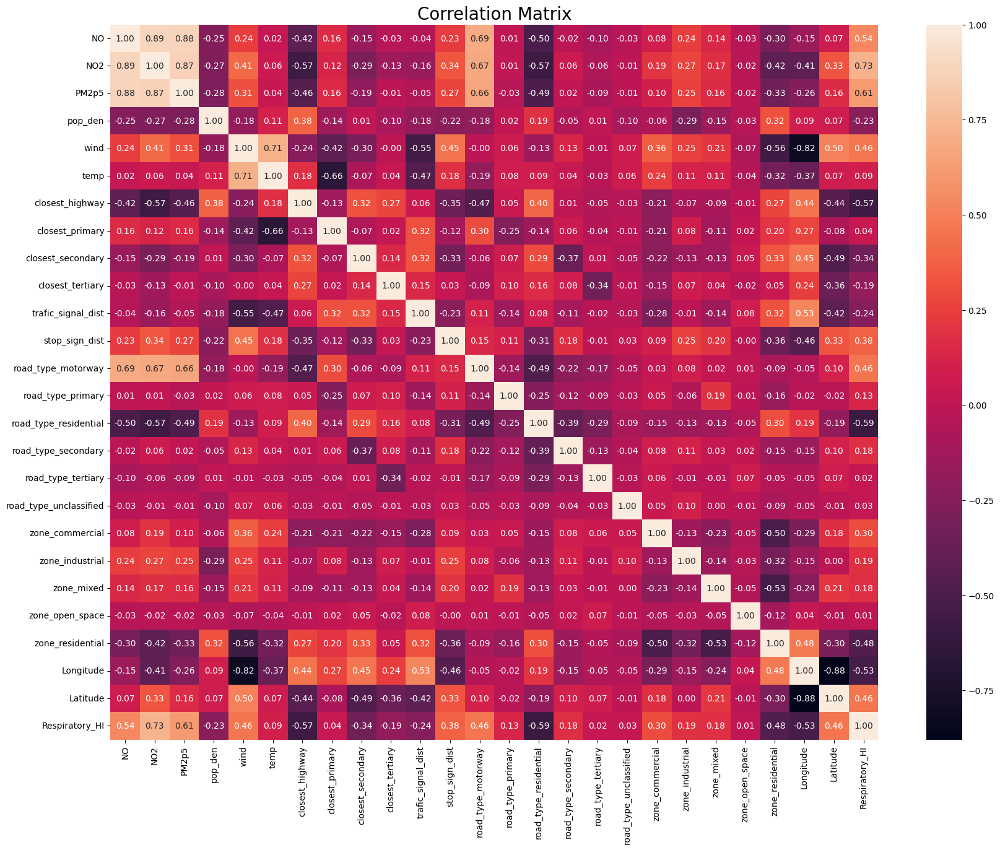

In [65]:
f, ax = plt.subplots(figsize= [20,15])
sns.heatmap(df_vis[numerical].corr(), annot=True, fmt=".2f", ax=ax)
ax.set_title("Correlation Matrix", fontsize=20)
plt.show()

In [66]:
Corr = pd.DataFrame(df_vis[numerical].corr()['Respiratory_HI'].sort_values(ascending=False))
Corr = Corr.iloc[1:,:]
Corr.columns=['Target Correlation']
Corr

,Target Correlation
NO2,0.728081
PM2p5,0.613451
NO,0.535749
Latitude,0.462277
road_type_motorway,0.459102
wind,0.458172
stop_sign_dist,0.382674
zone_commercial,0.300532
zone_industrial,0.192210
zone_mixed,0.183287


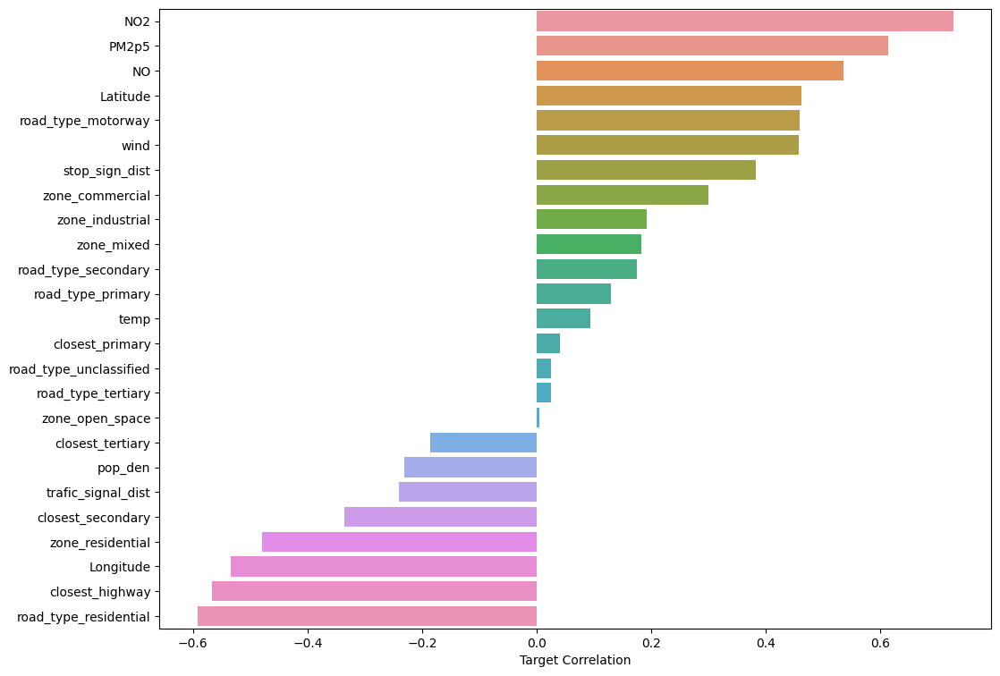

In [67]:
g0 = sns.barplot(x="Target Correlation", y=Corr.index, data=Corr)
g0.figure.set_size_inches(12, 9)

In [68]:
gpd_1_vis = gpd_1_city.copy()

Text(0, 0.5, 'Latitude')

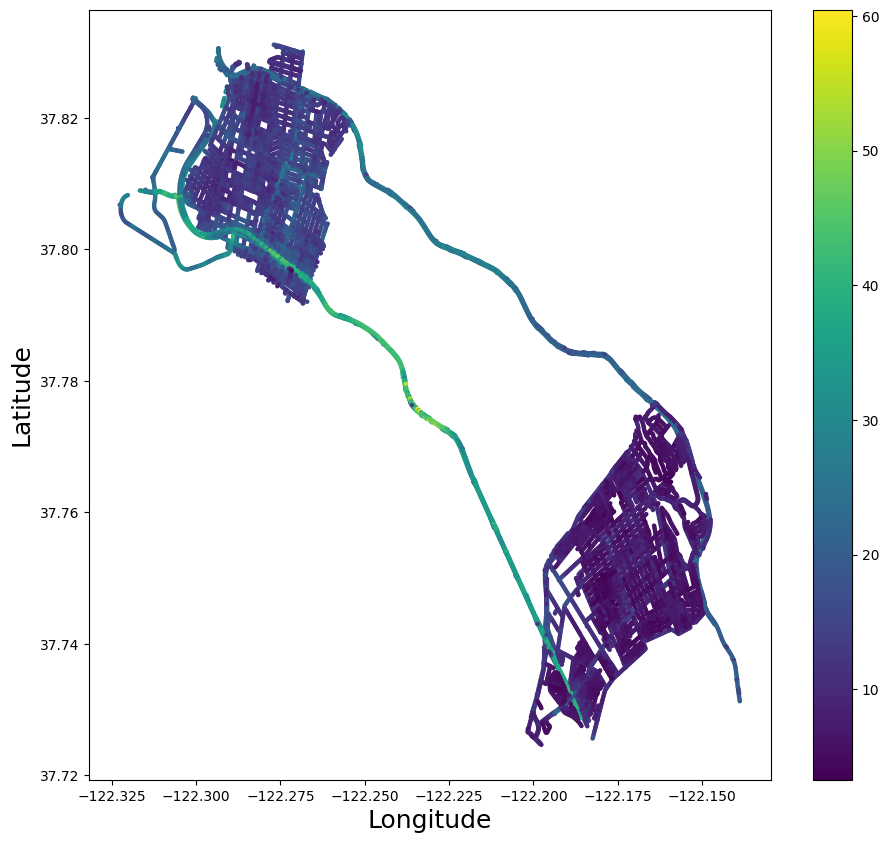

In [69]:
# Plot the overall heatmap
plt.figure(figsize = (11, 10))
plt.scatter(gpd_1_vis.Longitude, gpd_1_vis.Latitude, s=5, c = gpd_1_vis.NO2)
plt.colorbar(); plt.xlabel('Longitude', fontsize=18); plt.ylabel('Latitude', fontsize=18)

Text(0, 0.5, 'Latitude')

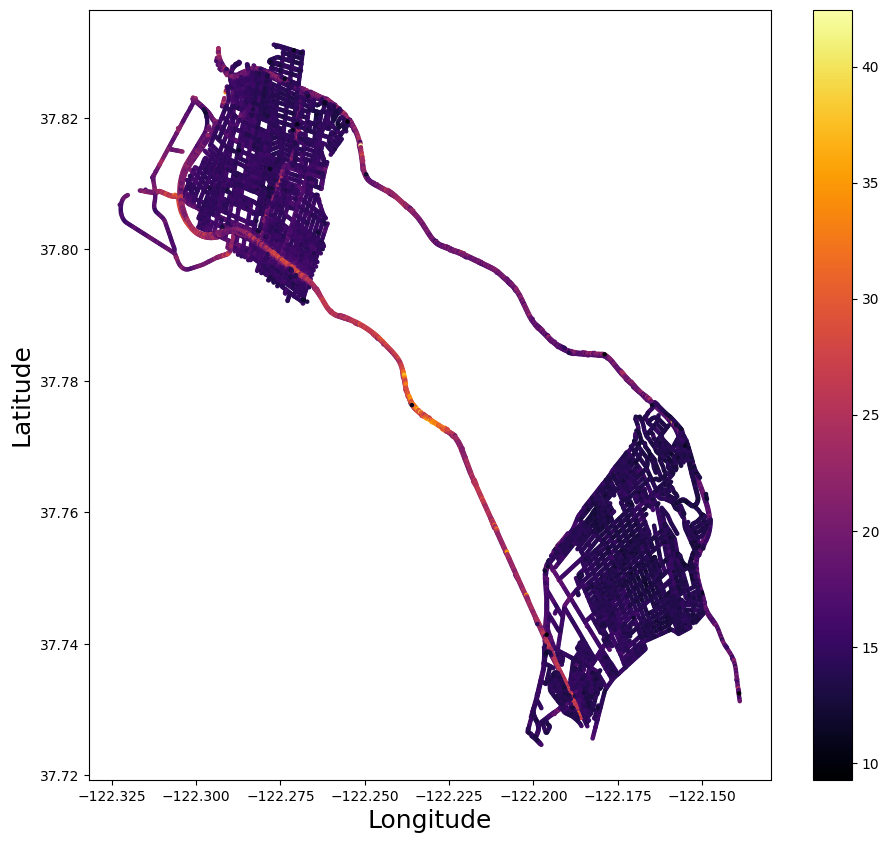

In [70]:
plt.figure(figsize = (11, 10))
plt.scatter(gpd_1_vis.Longitude, gpd_1_vis.Latitude, s=5, c = gpd_1_vis.PM2p5, cmap='inferno')
plt.colorbar(); plt.xlabel('Longitude', fontsize=18); plt.ylabel('Latitude', fontsize=18)

## boxplot - roads

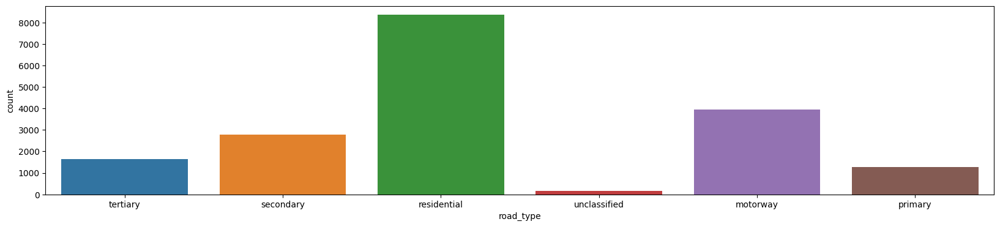

In [71]:
plt.figure(figsize=(20,4))
sns.countplot(x = 'road_type', data = df_vis);

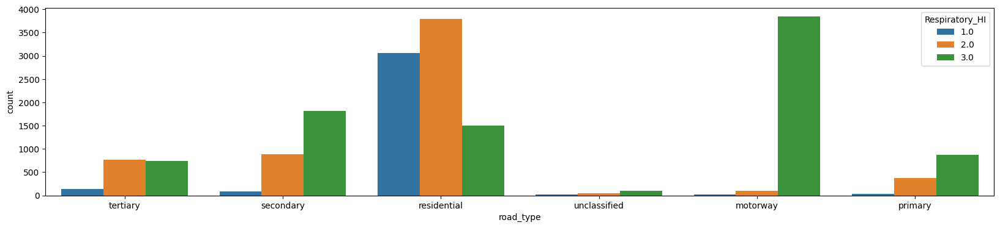

In [72]:
# Road type & health
plt.figure(figsize=(20,4))
sns.countplot(x = 'road_type', hue = df_vis['Respiratory_HI'], data = df_vis);

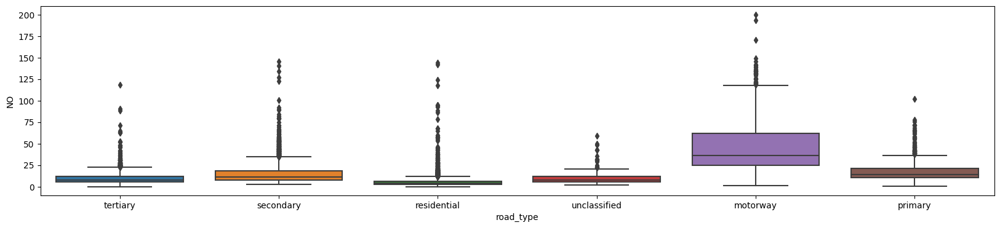

In [73]:
# NO on different road types
plt.figure(figsize=(20,4))
sns.boxplot(x = df_vis['road_type'], y = df_vis['NO']);

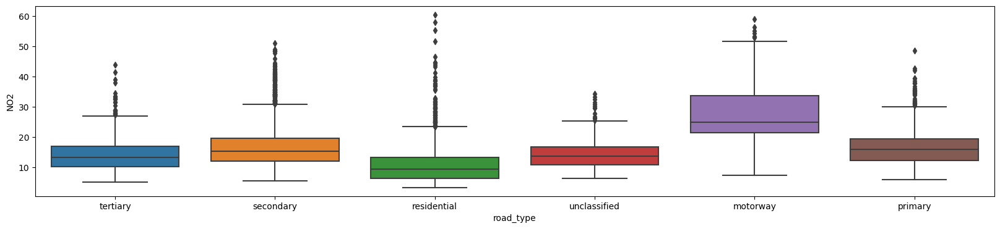

In [74]:
# NO2 on different road types
plt.figure(figsize=(20,4))
sns.boxplot(x = df_vis['road_type'], y = df_vis['NO2']);

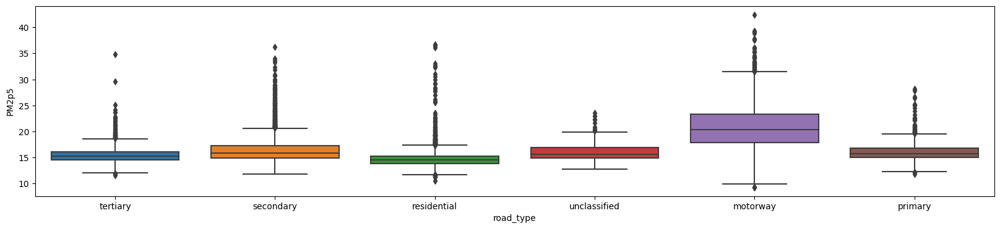

In [75]:
# PM2.5 on different road types
plt.figure(figsize=(20,4))
sns.boxplot(x = df_vis['road_type'], y = df_vis['PM2p5']);

## boxplot - zones

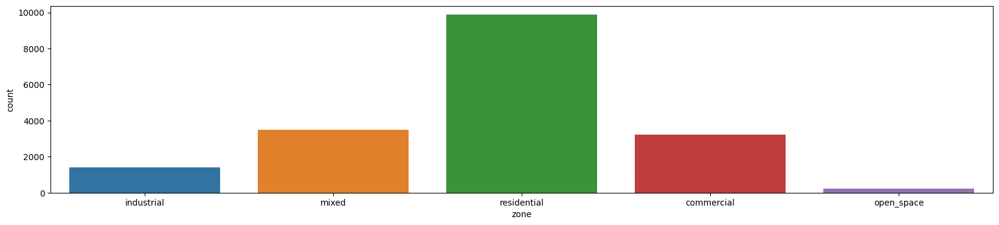

In [76]:
plt.figure(figsize=(20,4))
sns.countplot(x = 'zone', data = df_vis);

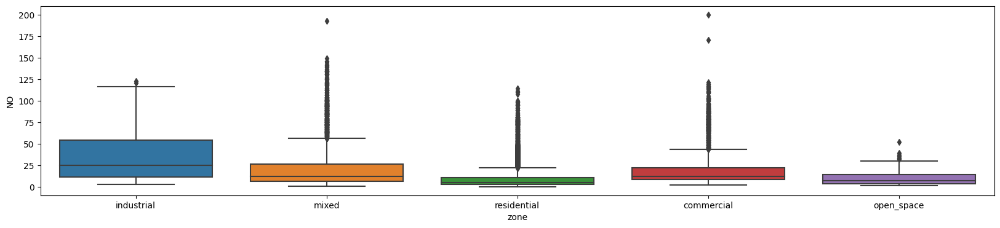

In [ ]:
# NO in different zones
plt.figure(figsize=(20,4))
sns.boxplot(x = df_vis['zone'], y = df_vis['NO']);

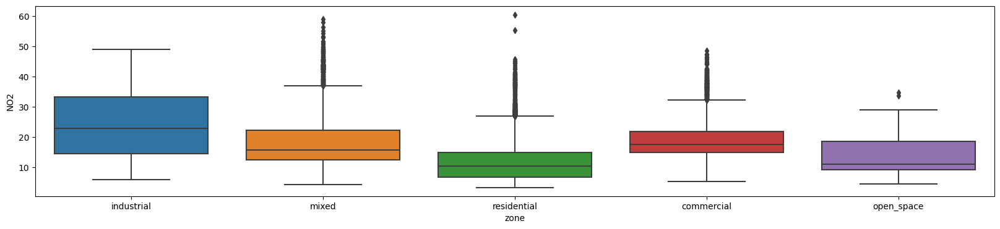

In [77]:
# NO2 in different zones
plt.figure(figsize=(20,4))
sns.boxplot(x = df_vis['zone'], y = df_vis['NO2']);

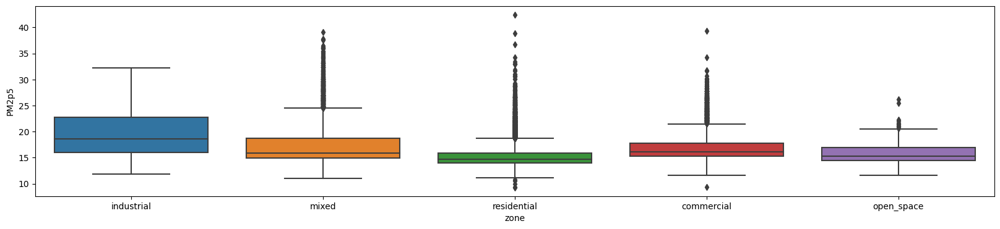

In [78]:
# PM2.5 in different zones
plt.figure(figsize=(20,4))
sns.boxplot(x = df_vis['zone'], y = df_vis['PM2p5']);

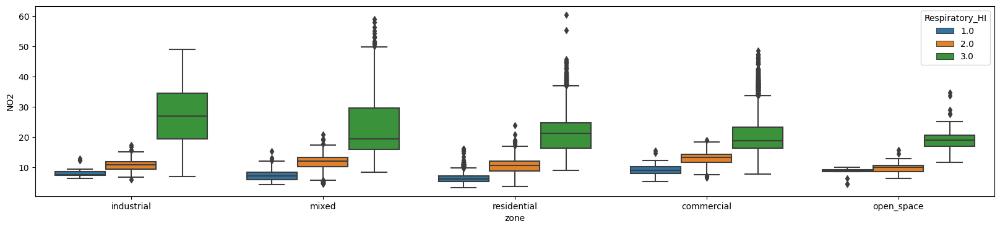

In [79]:
# NO2 in diffent zone & health
plt.figure(figsize=(20,4))
sns.boxplot(x = df_vis['zone'], y = df_vis['NO2'], hue = df_vis['Respiratory_HI']);

## distance

Text(0, 0.5, 'PM2.5 (ug/m3)')

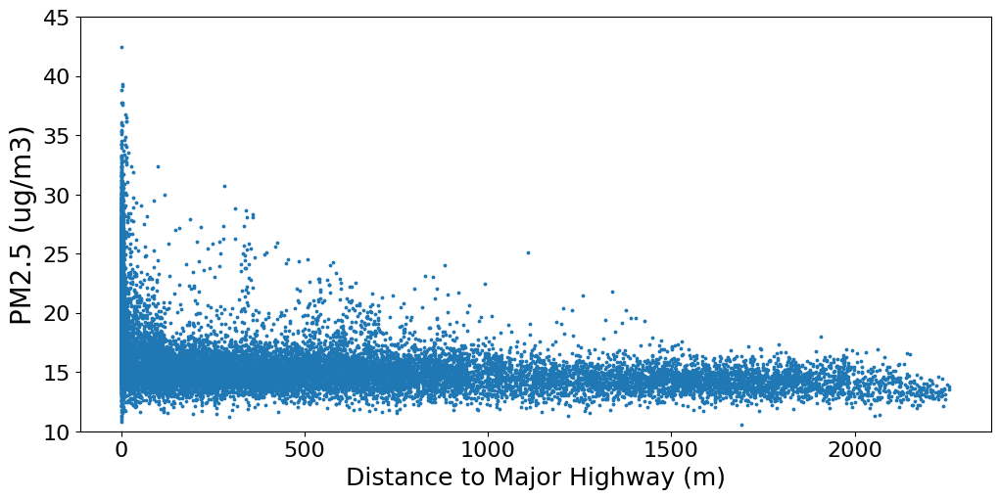

In [80]:
# PM2.5
plt.figure(figsize=(12, 5.5))
plt.scatter(df_vis['closest_highway'], df_vis['PM2p5'], s=3)
plt.ylim(10, 45)
plt.tick_params(labelsize=16)
plt.xlabel('Distance to Major Highway (m)', fontsize=18); plt.ylabel('PM2.5 (ug/m3)', fontsize=20)
# plt.savefig('highway_distance.png', format='png', dpi=300)

In [81]:
# save engineered dataset
df_vis.to_file('/content/drive/MyDrive/Colab Notebooks/model_data', driver='GeoJSON')


# 6.Model

We build a model for No2, NO and PM2.5 here, since they are common factors that cause lung diseases, as well as other various diseases that harm the public.

In [82]:
df_model = gpd.read_file('/content/drive/MyDrive/Colab Notebooks/model_data')

In [94]:
def abline(slope, intercept):
    """Plot a line from slope and intercept"""
    axes = plt.gca()
    x_vals = np.array(axes.get_xlim())
    y_vals = intercept + slope * x_vals
    plt.plot(x_vals, y_vals, '-', color='black')


def pred_summary(pred, ytest, limit = 200):
    """Plotting for test set predictions"""
    df = pd.DataFrame({"Predicted": pred, "Actual": ytest})
    sns.scatterplot(x="Predicted", y="Actual", data=df)
    abline(1, 0) #1-1 line
    plt.ylim(0, limit); plt.xlim(0, limit)
    plt.tick_params(labelsize=18)

    print('RMSE', np.sqrt(mean_squared_error(ytest, pred)))
    print('R2', r2_score(ytest, pred))



def plot_corr(df, size=10, MI = False):
    '''Function plots a graphical correlation matrix for each pair of columns in the dataframe.

    Input:
        df: pandas DataFrame
        size: vertical and horizontal size of the plot'''
    if MI == False:
        corr = df.corr()
    else:
        K = df.shape[1]
        corr = np.empty((K, K), dtype=float)

        for i, ac in enumerate(X.columns):
            for j, bc in enumerate(X.columns):
                MI = mutual_information(X.loc[:, ac], X.loc[:, bc], bins=10, normalize=True)
                corr[i, j] = MI

    fig, ax = plt.subplots(figsize=(size, size))
    ax.matshow(corr)
    plt.xticks(range(len(corr.columns)), corr.columns);
    plt.yticks(range(len(corr.columns)), corr.columns);

## Feature selection

In [84]:
df_model[numerical].columns

Index(['NO', 'NO2', 'PM2p5', 'pop_den', 'wind', 'temp', 'closest_highway',
       'closest_primary', 'closest_secondary', 'closest_tertiary',
       'trafic_signal_dist', 'stop_sign_dist', 'road_type_motorway',
       'road_type_primary', 'road_type_residential', 'road_type_secondary',
       'road_type_tertiary', 'road_type_unclassified', 'zone_commercial',
       'zone_industrial', 'zone_mixed', 'zone_open_space', 'zone_residential',
       'Longitude', 'Latitude', 'Respiratory_HI'],
      dtype='object')

In [85]:
X = df_model[numerical].drop(['Respiratory_HI', 'Longitude','Latitude', 'road_type_unclassified','NO', 'NO2', 'PM2p5'], axis=1)

X.columns

Index(['pop_den', 'wind', 'temp', 'closest_highway', 'closest_primary',
       'closest_secondary', 'closest_tertiary', 'trafic_signal_dist',
       'stop_sign_dist', 'road_type_motorway', 'road_type_primary',
       'road_type_residential', 'road_type_secondary', 'road_type_tertiary',
       'zone_commercial', 'zone_industrial', 'zone_mixed', 'zone_open_space',
       'zone_residential'],
      dtype='object')

## Model Selection

## Train-Test Split & Feature Scaling

In [113]:
# NO
y_NO = df_model['NO']
X_train_NO, X_test_NO, y_train_NO, y_test_NO = model_selection.train_test_split(X, y_NO, test_size=0.25, random_state= 1)
print('training data has ' + str(X_train_NO.shape[0]) + ' observation with ' + str(X_train_NO.shape[1]) + ' features')
print('test data has ' + str(X_test_NO.shape[0]) + ' observation with ' + str(X_test_NO.shape[1]) + ' features')

# Feature Scaling
scaler = StandardScaler()
scaler.fit(X_train_NO)
X_train_NO = scaler.transform(X_train_NO)
X_test_NO = scaler.transform(X_test_NO)

training data has 13662 observation with 19 features
test data has 4555 observation with 19 features


In [114]:
# NO2
y_NO2 = df_model['NO2']
X_train_NO2, X_test_NO2, y_train_NO2, y_test_NO2 = model_selection.train_test_split(X, y_NO2, test_size=0.25, random_state= 1)

# Feature Scaling
scaler = StandardScaler()
scaler.fit(X_train_NO2)
X_train_NO2 = scaler.transform(X_train_NO2)
X_test_NO2 = scaler.transform(X_test_NO2)

In [115]:
# PM2.5
y_PM = df_model['PM2p5']
X_train_PM, X_test_PM, y_train_PM, y_test_PM = model_selection.train_test_split(X, y_PM, test_size=0.25, random_state= 1)

# Feature Scaling
scaler = StandardScaler()
scaler.fit(X_train_PM)
X_train_PM = scaler.transform(X_train_PM)
X_test_PM = scaler.transform(X_test_PM)

## NO2

### Ensemble learning - Bagging

In [116]:
# Use the same random forest gridsearch as above
from sklearn.ensemble import RandomForestRegressor
forest = RandomForestRegressor(n_jobs=2)

params = {'max_features': [6, 8, 10],
          'n_estimators': [100, 150, 200]}

forest_grid_no2 = GridSearchCV(forest, params, cv=5, scoring = 'neg_mean_squared_error')
forest_grid_no2.fit(X_train_NO2, y_train_NO2)

GridSearchCV(cv=5, estimator=RandomForestRegressor(n_jobs=2),
             param_grid={'max_features': [6, 8, 10],
                         'n_estimators': [100, 150, 200]},
             scoring='neg_mean_squared_error')

In [117]:
# Best estimator
forest_grid_no2.best_estimator_

RandomForestRegressor(max_features=8, n_estimators=150, n_jobs=2)

RMSE 2.192794092478019
R2 0.9394211399426807


Text(0, 0.5, 'Observed NO$_2$')

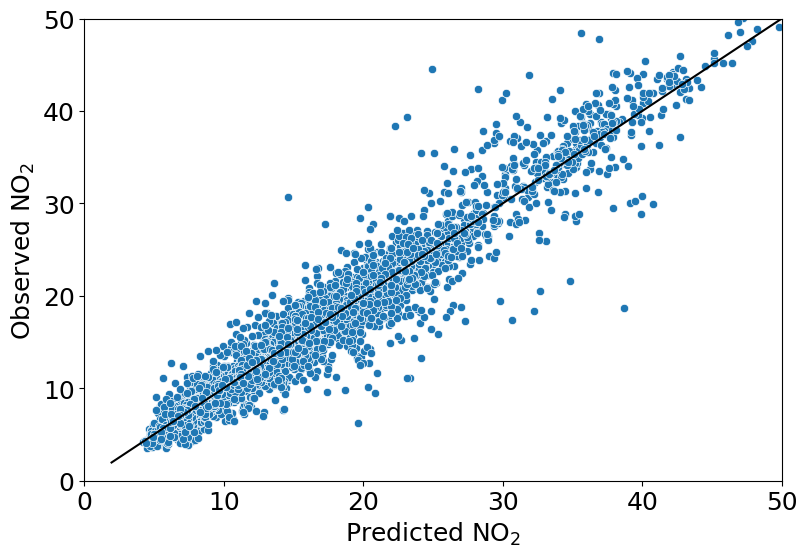

In [118]:
fig = plt.figure(figsize=(9,6))
forest_out_no2 = forest_grid_no2.predict(X_test_NO2)
pred_summary(forest_out_no2, y_test_NO2, limit=50)
plt.xlabel('Predicted NO$_2$', fontsize = 18); plt.ylabel('Observed NO$_2$', fontsize=18)

In [121]:
FI_rf = pd.DataFrame(forest_grid_no2.best_estimator_.feature_importances_, index=X.columns, columns=['Feature Importance (RF)'])
FI_rf = FI_rf.sort_values(by='Feature Importance (RF)',ascending=False)
FI_rf # major factor identification

,Feature Importance (RF)
closest_highway,0.293273
road_type_motorway,0.176392
wind,0.138076
road_type_residential,0.065790
temp,0.056239
pop_den,0.047931
closest_primary,0.040018
closest_tertiary,0.033186
stop_sign_dist,0.032988
closest_secondary,0.032934


### ensemble learning - Boosting

In [122]:
gb_forest = GradientBoostingRegressor()

params = {'max_features': [6, 8, 10],
          'learning_rate': [0.05, 0.1, 0.5],
          'n_estimators': [100, 150, 200]}

gb_forest_grid_no2 = GridSearchCV(gb_forest, params, cv=5, scoring = 'neg_mean_squared_error')
gb_forest_grid_no2.fit(X_train_NO2, y_train_NO2)

GridSearchCV(cv=5, estimator=GradientBoostingRegressor(),
             param_grid={'learning_rate': [0.05, 0.1, 0.5],
                         'max_features': [6, 8, 10],
                         'n_estimators': [100, 150, 200]},
             scoring='neg_mean_squared_error')

In [123]:
# Best estimator
gb_forest_grid_no2.best_estimator_

GradientBoostingRegressor(learning_rate=0.5, max_features=8, n_estimators=200)

RMSE 3.03009617061887
R2 0.8843253439501216


Text(0, 0.5, 'Observed NO$_2$')

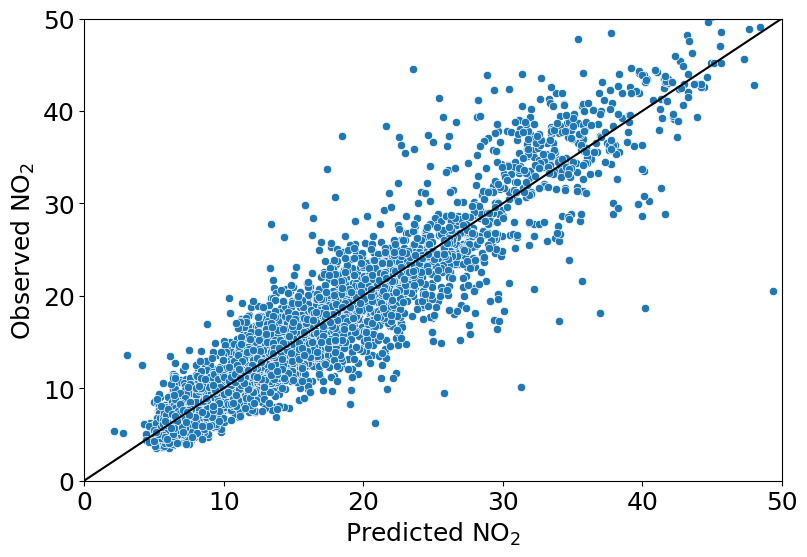

In [124]:
fig = plt.figure(figsize=(9,6))
gb_forest_out_no2 = gb_forest_grid_no2.predict(X_test_NO2)
pred_summary(gb_forest_out_no2, y_test_NO2, limit=50)
plt.xlabel('Predicted NO$_2$', fontsize = 18); plt.ylabel('Observed NO$_2$', fontsize=18)

In [125]:
FI_gb = pd.DataFrame(gb_forest_grid_no2.best_estimator_.feature_importances_, index=X.columns, columns=['Feature Importance (GB)'])
FI_gb = FI_gb.sort_values(by='Feature Importance (GB)',ascending=False)
FI_gb

,Feature Importance (GB)
road_type_motorway,0.276942
closest_highway,0.234333
zone_residential,0.147516
wind,0.101583
temp,0.067950
pop_den,0.048792
closest_secondary,0.030941
closest_primary,0.018349
stop_sign_dist,0.018026
closest_tertiary,0.017877


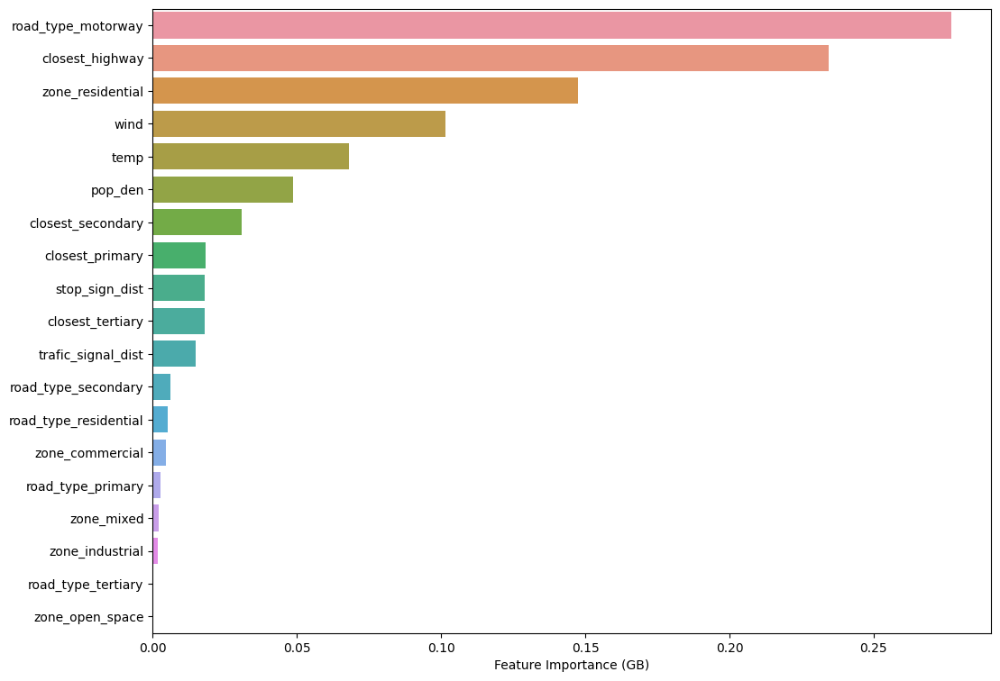

In [126]:
g2 = sns.barplot(x="Feature Importance (GB)", y=FI_gb.index, data=FI_gb)
g2.figure.set_size_inches(12, 9)

### permutation Importance

In [127]:
# Current paramters
grid_search_best_no2 = forest_grid_no2.best_estimator_
pprint(grid_search_best_no2.get_params())

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'criterion': 'squared_error',
 'max_depth': None,
 'max_features': 8,
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 150,
 'n_jobs': 2,
 'oob_score': False,
 'random_state': None,
 'verbose': 0,
 'warm_start': False}


In [129]:
# Permutation Importance
PI_no2 = permutation_importance(grid_search_best_no2, X_test_NO2, y_test_NO2, n_repeats=5, random_state=1)

PI_res = pd.DataFrame(data=np.transpose([PI_no2['importances_mean'],PI_no2['importances_std']]),
             index = X.columns,columns=['PI_mean','PI_std'])
PI_res = PI_res.sort_values(by='PI_mean',ascending=False)
PI_res

,PI_mean,PI_std
closest_highway,0.478346,0.003207
wind,0.249580,0.001305
road_type_motorway,0.129848,0.001675
temp,0.069535,0.000340
closest_primary,0.052400,0.001756
pop_den,0.047282,0.001953
road_type_residential,0.038778,0.000767
closest_secondary,0.037558,0.002361
stop_sign_dist,0.035403,0.000787
closest_tertiary,0.028725,0.000884


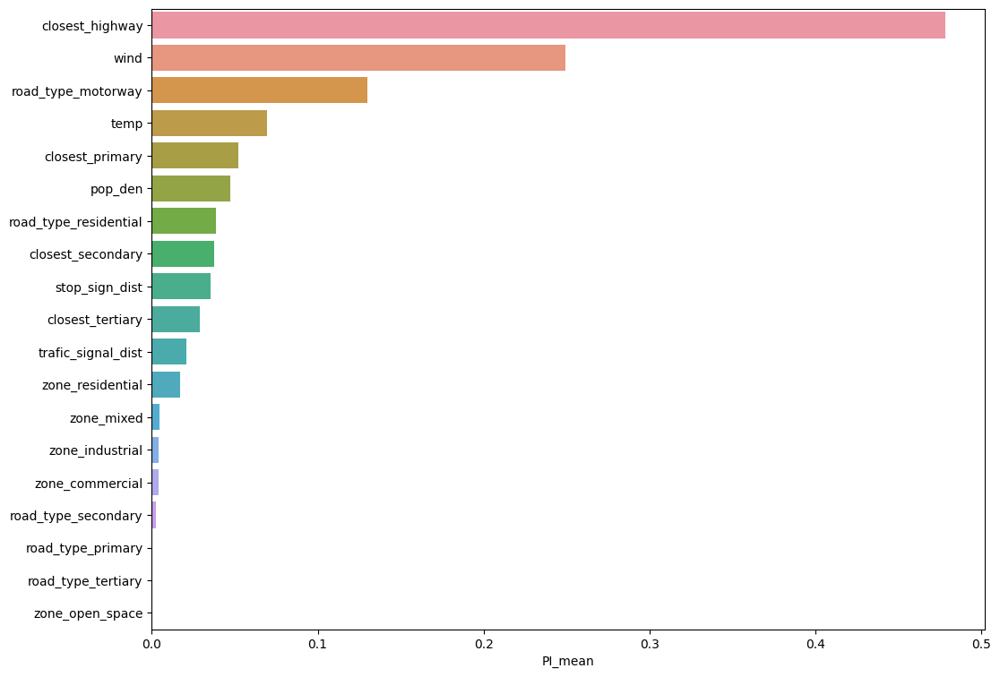

In [130]:
g1 = sns.barplot(x="PI_mean", y=PI_res.index, data=PI_res)
g1.figure.set_size_inches(12, 9)

### result summary

In [131]:
summary_0 = pd.DataFrame({'Random Forest':list(FI_rf.index),
              'Gradient Boost':list(FI_gb.index),
               'Permutation Importance':list(PI_res.index)})
summary_0

,Random Forest,Gradient Boost,Permutation Importance
0,closest_highway,road_type_motorway,closest_highway
1,road_type_motorway,closest_highway,wind
2,wind,zone_residential,road_type_motorway
3,road_type_residential,wind,temp
4,temp,temp,closest_primary
5,pop_den,pop_den,pop_den
6,closest_primary,closest_secondary,road_type_residential
7,closest_tertiary,closest_primary,closest_secondary
8,stop_sign_dist,stop_sign_dist,stop_sign_dist
9,closest_secondary,closest_tertiary,closest_tertiary


## NO

### Ensemble learning - Bagging

In [138]:
forest = RandomForestRegressor(n_jobs=2)

params = {'max_features': [6, 8, 10],
          'n_estimators': [100, 150, 200]}

forest_grid_no = GridSearchCV(forest, params, cv=5, scoring = 'neg_mean_squared_error')
forest_grid_no.fit(X_train_NO, y_train_NO)

GridSearchCV(cv=5, estimator=RandomForestRegressor(n_jobs=2),
             param_grid={'max_features': [6, 8, 10],
                         'n_estimators': [100, 150, 200]},
             scoring='neg_mean_squared_error')

In [139]:
# Best estimator
forest_grid_no.best_estimator_

RandomForestRegressor(max_features=10, n_estimators=150, n_jobs=2)

RMSE 5.96225648422219
R2 0.9166196752819058


Text(0, 0.5, 'Observed NO')

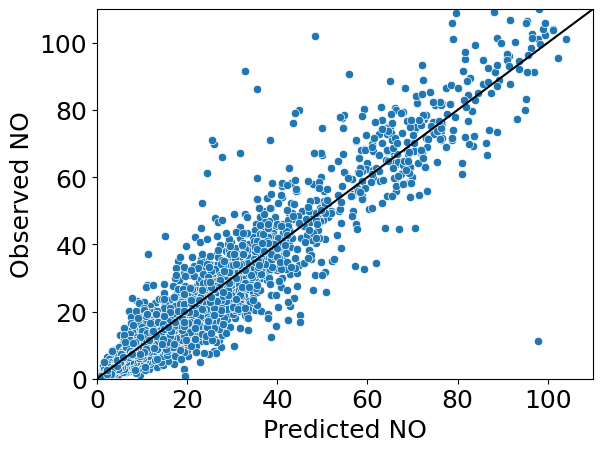

In [140]:
forest_NO = forest_grid_no.predict(X_test_NO)
pred_summary(forest_NO, y_test_NO, limit=110)
plt.xlabel('Predicted NO', fontsize = 18); plt.ylabel('Observed NO', fontsize=18)

In [141]:
FI_rf = pd.DataFrame(forest_grid_no.best_estimator_.feature_importances_, index=X.columns, columns=['Feature Importance (RF)'])
FI_rf = FI_rf.sort_values(by='Feature Importance (RF)',ascending=False)
FI_rf # major factor identification

,Feature Importance (RF)
road_type_motorway,0.250696
closest_highway,0.247293
temp,0.104310
wind,0.060605
road_type_residential,0.050895
closest_primary,0.050491
pop_den,0.049517
closest_tertiary,0.043917
closest_secondary,0.039621
stop_sign_dist,0.036448


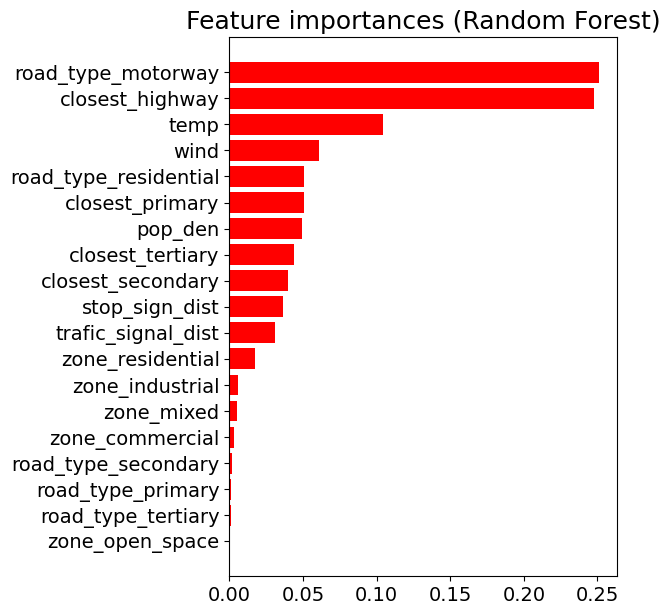

In [143]:
features = X.columns
importance = forest_grid_no.best_estimator_.feature_importances_
indices = np.argsort(importance)
plt.figure(figsize=(5, 7))
plt.title("Feature importances (Random Forest)", fontsize = 18)
plt.barh(features[indices], importance[indices],
       color="r",  align="center")
plt.tick_params(labelsize=14);

### Ensemble learning - Boosting

In [162]:
gb_forest = GradientBoostingRegressor()

params = {'max_features': [6, 8, 10],
          'learning_rate': [0.05, 0.1, 0.5],
          'n_estimators': [100, 150, 200]}

gb_forest_grid_no = GridSearchCV(gb_forest, params, cv=5, scoring = 'neg_mean_squared_error')
gb_forest_grid_no.fit(X_train_NO, y_train_NO)

GridSearchCV(cv=5, estimator=GradientBoostingRegressor(),
             param_grid={'learning_rate': [0.05, 0.1, 0.5],
                         'max_features': [6, 8, 10],
                         'n_estimators': [100, 150, 200]},
             scoring='neg_mean_squared_error')

In [163]:
# Best estimator
gb_forest_grid_no.best_estimator_

GradientBoostingRegressor(learning_rate=0.5, max_features=8, n_estimators=200)

RMSE 7.594224033494087
R2 0.8647276350575385


Text(0, 0.5, 'Observed NO')

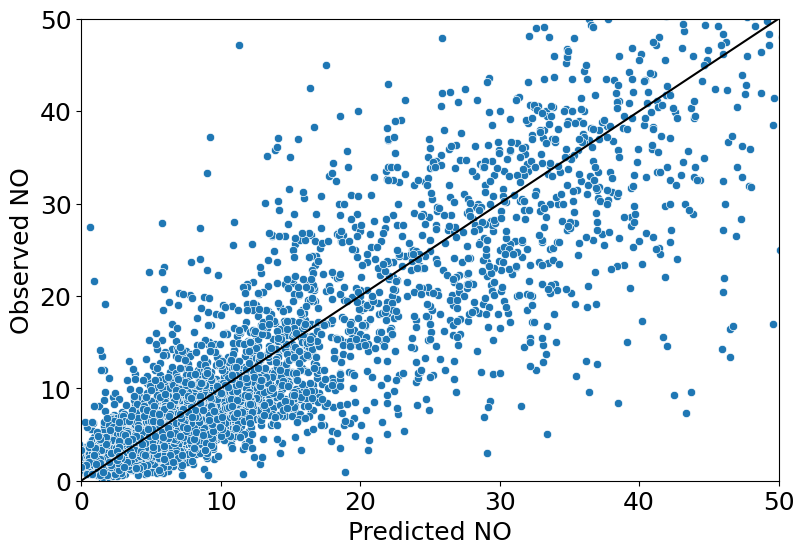

In [164]:
fig = plt.figure(figsize=(9,6))
gb_forest_out_no = gb_forest_grid_no.predict(X_test_NO)
pred_summary(gb_forest_out_no, y_test_NO, limit=50)
plt.xlabel('Predicted NO', fontsize = 18); plt.ylabel('Observed NO', fontsize=18)

In [165]:
FI_gb = pd.DataFrame(gb_forest_grid_no.best_estimator_.feature_importances_, index=X.columns, columns=['Feature Importance (GB)'])
FI_gb = FI_gb.sort_values(by='Feature Importance (GB)',ascending=False)
FI_gb

,Feature Importance (GB)
road_type_motorway,0.427296
closest_highway,0.157130
temp,0.138304
wind,0.058235
road_type_residential,0.036399
pop_den,0.032698
closest_tertiary,0.030986
closest_primary,0.028964
stop_sign_dist,0.019547
closest_secondary,0.018874


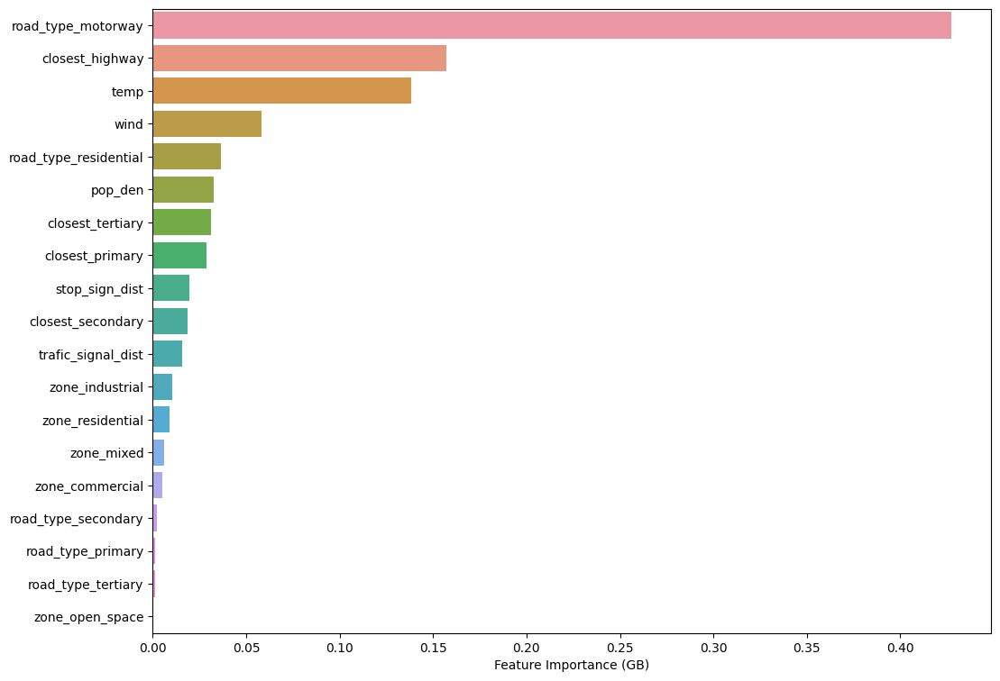

In [166]:
g2 = sns.barplot(x="Feature Importance (GB)", y=FI_gb.index, data=FI_gb)
g2.figure.set_size_inches(12, 9)

### permutation importance

In [167]:
# Current paramters
grid_search_best_no = forest_grid_no.best_estimator_
pprint(grid_search_best_no.get_params())

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'criterion': 'squared_error',
 'max_depth': None,
 'max_features': 10,
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 150,
 'n_jobs': 2,
 'oob_score': False,
 'random_state': None,
 'verbose': 0,
 'warm_start': False}


In [168]:
# Permutation Importance
PI_no = permutation_importance(grid_search_best_no, X_test_NO, y_test_NO, n_repeats=5, random_state=1)

PI_res = pd.DataFrame(data=np.transpose([PI_no['importances_mean'],PI_no['importances_std']]),
             index = X.columns,columns=['PI_mean','PI_std'])
PI_res = PI_res.sort_values(by='PI_mean',ascending=False)
PI_res

,PI_mean,PI_std
closest_highway,0.466871,0.003839
road_type_motorway,0.246942,0.004287
temp,0.184435,0.002424
wind,0.097350,0.002196
closest_primary,0.064743,0.001130
pop_den,0.059935,0.001865
closest_secondary,0.052227,0.003678
road_type_residential,0.046374,0.000647
closest_tertiary,0.043815,0.000737
stop_sign_dist,0.033572,0.001083


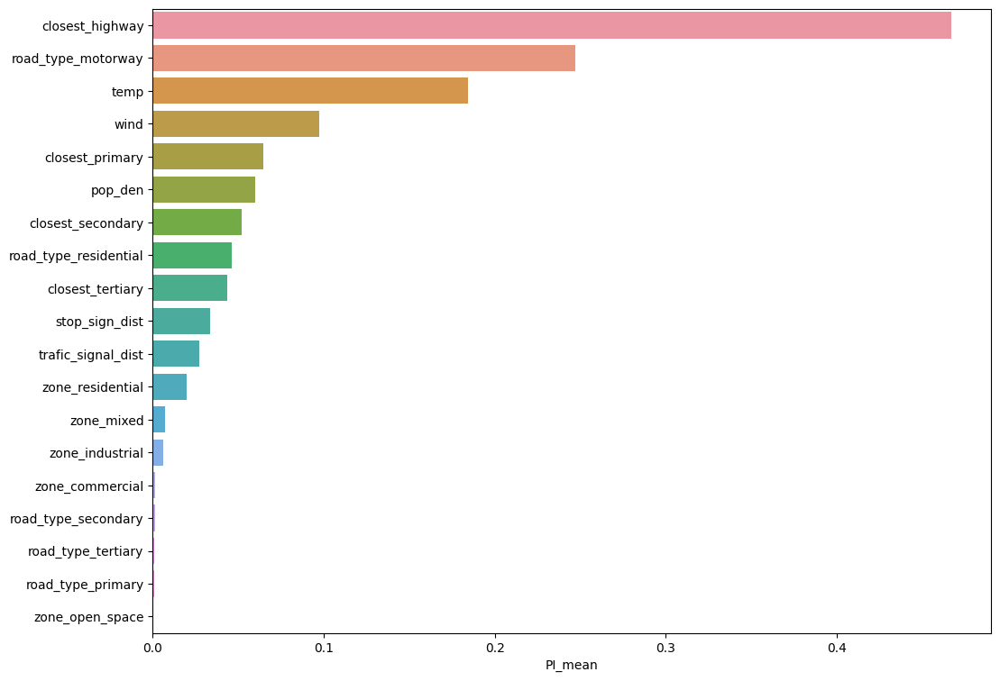

In [169]:
g1 = sns.barplot(x="PI_mean", y=PI_res.index, data=PI_res)
g1.figure.set_size_inches(12, 9)

### result summary

In [170]:
summary_1 = pd.DataFrame({'Random Forest':list(FI_rf.index),
              'Gradient Boost':list(FI_gb.index),
               'Permutation Importance':list(PI_res.index)})
summary_1

,Random Forest,Gradient Boost,Permutation Importance
0,closest_highway,road_type_motorway,closest_highway
1,road_type_motorway,closest_highway,road_type_motorway
2,wind,temp,temp
3,road_type_residential,wind,wind
4,closest_primary,road_type_residential,closest_primary
5,pop_den,pop_den,pop_den
6,temp,closest_tertiary,closest_secondary
7,closest_tertiary,closest_primary,road_type_residential
8,closest_secondary,stop_sign_dist,closest_tertiary
9,stop_sign_dist,closest_secondary,stop_sign_dist


## PM2.5

### Ensemble learning - Bagging

In [157]:
forest = RandomForestRegressor(n_jobs=2)

params = {'max_features': [6, 8, 10],
          'n_estimators': [150, 200, 250]}

forest_grid_pm = GridSearchCV(forest, params, cv=5, scoring = 'neg_mean_squared_error')
forest_grid_pm.fit(X_train_PM, y_train_PM)

GridSearchCV(cv=5, estimator=RandomForestRegressor(n_jobs=2),
             param_grid={'max_features': [6, 8, 10],
                         'n_estimators': [150, 200, 250]},
             scoring='neg_mean_squared_error')

In [158]:
# Best estimator
forest_grid_pm.best_estimator_

RandomForestRegressor(max_features=6, n_estimators=250, n_jobs=2)

RMSE 1.3934137346493018
R2 0.8337953703436838


Text(0, 0.5, 'Observed PM')

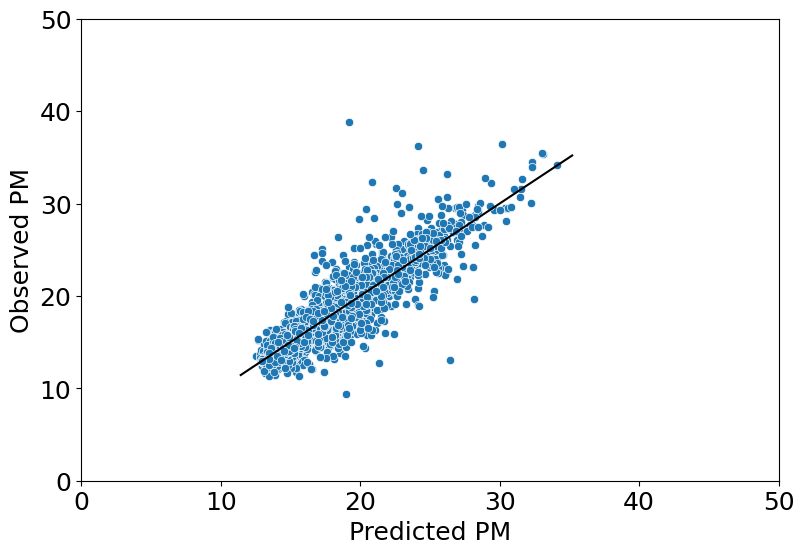

In [159]:
fig = plt.figure(figsize=(9,6))
forest_out_pm = forest_grid_pm.predict(X_test_PM)
pred_summary(forest_out_pm, y_test_PM, limit=50)
plt.xlabel('Predicted PM', fontsize = 18); plt.ylabel('Observed PM', fontsize=18)

In [160]:
FI_rf = pd.DataFrame(forest_grid_pm.best_estimator_.feature_importances_, index=X.columns, columns=['Feature Importance (RF)'])
FI_rf = FI_rf.sort_values(by='Feature Importance (RF)',ascending=False)
FI_rf # major factor identification

,Feature Importance (RF)
closest_highway,0.220912
road_type_motorway,0.196775
wind,0.095685
road_type_residential,0.069711
closest_primary,0.061271
pop_den,0.057983
temp,0.056651
closest_tertiary,0.053849
closest_secondary,0.047044
stop_sign_dist,0.046062


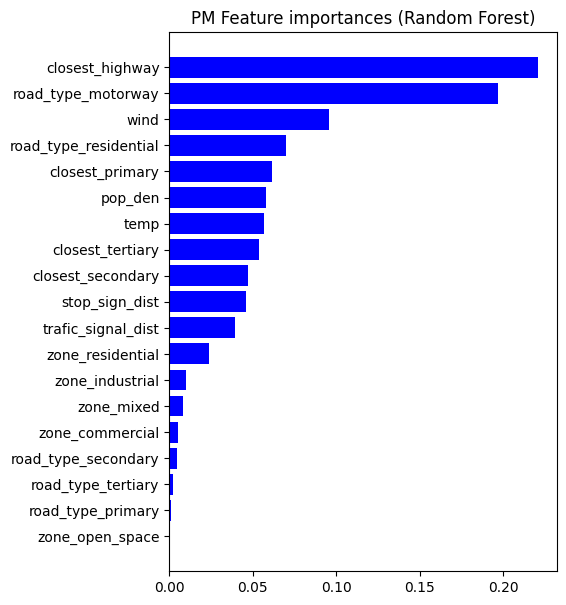

In [161]:
features = X.columns
importance = forest_grid_pm.best_estimator_.feature_importances_
indices = np.argsort(importance)
plt.figure(figsize=(5, 7))
plt.title("PM Feature importances (Random Forest)")
plt.barh(features[indices], importance[indices],
       color="b",  align="center");

### Ensemble learning - Boosting

In [171]:
gb_forest = GradientBoostingRegressor()

params = {'max_features': [6, 8, 10],
          'learning_rate': [0.05, 0.1, 0.5],
          'n_estimators': [100, 150, 200]}

gb_forest_grid_pm = GridSearchCV(gb_forest, params, cv=5, scoring = 'neg_mean_squared_error')
gb_forest_grid_pm.fit(X_train_PM, y_train_PM)

GridSearchCV(cv=5, estimator=GradientBoostingRegressor(),
             param_grid={'learning_rate': [0.05, 0.1, 0.5],
                         'max_features': [6, 8, 10],
                         'n_estimators': [100, 150, 200]},
             scoring='neg_mean_squared_error')

In [172]:
# Best estimator
gb_forest_grid_pm.best_estimator_

GradientBoostingRegressor(learning_rate=0.5, max_features=10, n_estimators=200)

RMSE 1.5930165556708729
R2 0.7827681395958284


Text(0, 0.5, 'Observed PM 2.5')

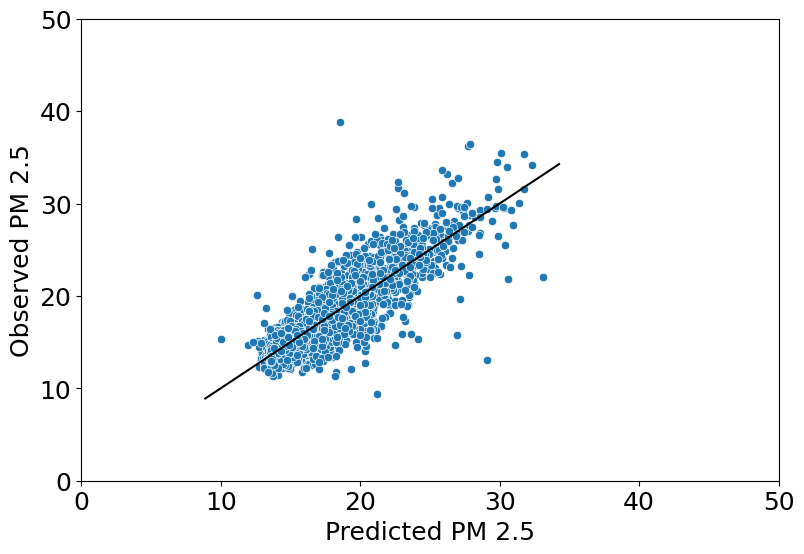

In [173]:
fig = plt.figure(figsize=(9,6))
gb_forest_out_pm = gb_forest_grid_pm.predict(X_test_PM)
pred_summary(gb_forest_out_pm, y_test_PM, limit=50)
plt.xlabel('Predicted PM 2.5', fontsize = 18); plt.ylabel('Observed PM 2.5', fontsize=18)

In [174]:
FI_gb = pd.DataFrame(gb_forest_grid_pm.best_estimator_.feature_importances_, index=X.columns, columns=['Feature Importance (GB)'])
FI_gb = FI_gb.sort_values(by='Feature Importance (GB)',ascending=False)
FI_gb

,Feature Importance (GB)
closest_highway,0.412792
road_type_motorway,0.153696
temp,0.142906
wind,0.049809
pop_den,0.049200
closest_tertiary,0.036398
zone_residential,0.035484
closest_secondary,0.030881
closest_primary,0.022125
stop_sign_dist,0.016612


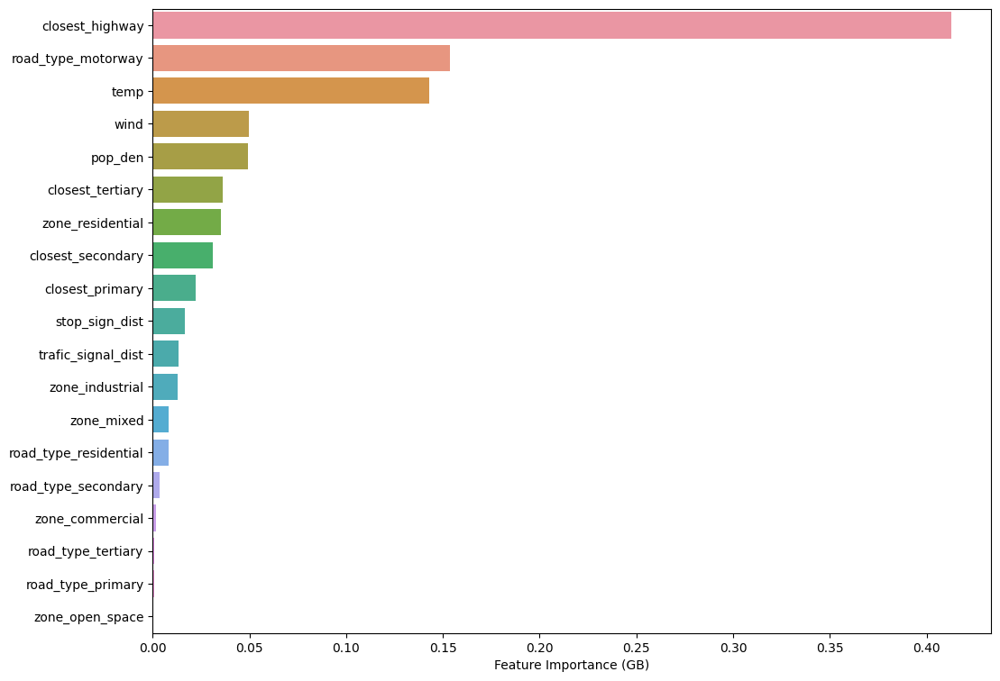

In [175]:
g2 = sns.barplot(x="Feature Importance (GB)", y=FI_gb.index, data=FI_gb)
g2.figure.set_size_inches(12, 9)

### permutation importance

In [176]:
# Current paramters
grid_search_best_pm = forest_grid_pm.best_estimator_
pprint(grid_search_best_pm.get_params())

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'criterion': 'squared_error',
 'max_depth': None,
 'max_features': 6,
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 250,
 'n_jobs': 2,
 'oob_score': False,
 'random_state': None,
 'verbose': 0,
 'warm_start': False}


In [177]:
# Permutation Importance
PI_pm = permutation_importance(grid_search_best_pm, X_test_PM, y_test_PM, n_repeats=5, random_state=1)

PI_res = pd.DataFrame(data=np.transpose([PI_pm['importances_mean'],PI_pm['importances_std']]),
             index = X.columns,columns=['PI_mean','PI_std'])
PI_res = PI_res.sort_values(by='PI_mean',ascending=False)
PI_res

,PI_mean,PI_std
closest_highway,0.326532,0.003587
road_type_motorway,0.181224,0.005915
wind,0.159140,0.005906
temp,0.065804,0.002471
closest_primary,0.054320,0.003349
pop_den,0.050235,0.001862
closest_tertiary,0.034409,0.002846
stop_sign_dist,0.030076,0.001780
road_type_residential,0.027551,0.000822
closest_secondary,0.026687,0.002124


### result summary

In [178]:
summary_2 = pd.DataFrame({'Random Forest':list(FI_rf.index),
              'Gradient Boost':list(FI_gb.index),
               'Permutation Importance':list(PI_res.index)})
summary_2

,Random Forest,Gradient Boost,Permutation Importance
0,closest_highway,closest_highway,closest_highway
1,road_type_motorway,road_type_motorway,road_type_motorway
2,wind,temp,wind
3,road_type_residential,wind,temp
4,closest_primary,pop_den,closest_primary
5,pop_den,closest_tertiary,pop_den
6,temp,zone_residential,closest_tertiary
7,closest_tertiary,closest_secondary,stop_sign_dist
8,closest_secondary,closest_primary,road_type_residential
9,stop_sign_dist,stop_sign_dist,closest_secondary


## All model results

In [183]:
result = pd.concat([summary_0, summary_1, summary_2], axis=1)
result.columns = ['Random Forest NO2', 'Gradient Boost NO2', 'Permutation Importance NO2',
       'Random Forest NO', 'Gradient Boost NO', 'Permutation Importance NO',
       'Random Forest PM2.5', 'Gradient Boost PM2.5', 'Permutation Importance PM2.5']
result

,Random Forest NO2,Gradient Boost NO2,Permutation Importance NO2,Random Forest NO,Gradient Boost NO,Permutation Importance NO,Random Forest PM2.5,Gradient Boost PM2.5,Permutation Importance PM2.5
0,closest_highway,road_type_motorway,closest_highway,closest_highway,road_type_motorway,closest_highway,closest_highway,closest_highway,closest_highway
1,road_type_motorway,closest_highway,wind,road_type_motorway,closest_highway,road_type_motorway,road_type_motorway,road_type_motorway,road_type_motorway
2,wind,zone_residential,road_type_motorway,wind,temp,temp,wind,temp,wind
3,road_type_residential,wind,temp,road_type_residential,wind,wind,road_type_residential,wind,temp
4,temp,temp,closest_primary,closest_primary,road_type_residential,closest_primary,closest_primary,pop_den,closest_primary
5,pop_den,pop_den,pop_den,pop_den,pop_den,pop_den,pop_den,closest_tertiary,pop_den
6,closest_primary,closest_secondary,road_type_residential,temp,closest_tertiary,closest_secondary,temp,zone_residential,closest_tertiary
7,closest_tertiary,closest_primary,closest_secondary,closest_tertiary,closest_primary,road_type_residential,closest_tertiary,closest_secondary,stop_sign_dist
8,stop_sign_dist,stop_sign_dist,stop_sign_dist,closest_secondary,stop_sign_dist,closest_tertiary,closest_secondary,closest_primary,road_type_residential
9,closest_secondary,closest_tertiary,closest_tertiary,stop_sign_dist,closest_secondary,stop_sign_dist,stop_sign_dist,stop_sign_dist,closest_secondary


We can see that for all three harmful substances, the most importnat common factor using all three models is how close the houses are to the highway, which makes sense as they often cause pollutions in the nearby area. Overall, how far residences are from any type of roads contribute significantly to their levels of these substances, which implies that choosing an area relatively further from the roads may contribute positively to the overall health level of the household.